<a href="https://colab.research.google.com/github/Samy-Annasri/Internship-Adversarial-time-series/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Note:
For the moment, everything is not perfect. For example, I think the BIM attack might be implemented incorrectly based on the results. Moreover, a lot of the code could be refactored to be more efficient and avoid repetition. I also tried to write comments in English, but I believe there are many grammatical mistakes in the notebook, which I will correct when I have time.
This is just what I have done over the past two weeks :)

# Objective of this Notebook

This notebook explores the implementation of different AI models **LSTM**, **RNN** and **CNN** for **time series forecasting adversial attack**.

To achieve this, I use two datasets:

- **GlobalLandTemperaturesByCity**: This dataset is used to forecast temperatures in France based on historical climate data.

    https://www.kaggle.com/datasets/berkeleyearth/climate-change-earth-surface-temperature-data?resource=download&select=GlobalLandTemperaturesByCity.csv)
- **Google Stock Data (last 5 years)**: This dataset is used in a similar way to predict Google's stock price trends.

    https://www.nasdaq.com/market-activity/stocks/goog/historical?page=126&rows_per_page=10&timeline=y5

After building and evaluating the forecasting models, I implement several **adversarial attacks**, including **FGSM**, **BIM**, and a more recent method known as **TCA** (for more details, see the "Adversarial part" section below).

To assess the impact of these attacks, I use the following metrics:

- **MAE** (Mean Absolute Error)  
- **RMSE** (Root Mean Square Error)  
- **SIM** (Scalar Similarity)

An adversarial attack is considered effective if it satisfies the following three criteria:

- **Effectiveness** — it significantly alters the model’s output.  
- **Stealthiness** — it introduces minimal perturbation to avoid detection.  
- **Rationality** — the perturbation remains within a reasonable and realistic range.

To finish, their is for each DataSet a analysis and Question part when i just talk about the result and some strange thing in the result that i can't explain for the moment

In [16]:
import sys
import os

def in_colab():
    return 'google.colab' in sys.modules

if in_colab():
    repo_name = "Internship-Adversarial-time-series"
    cwd = os.getcwd()
    basename = os.path.basename(cwd)

    if basename != repo_name:
        if not os.path.exists(repo_name):
            !git clone https://github.com/Samy-Annasri/Internship-Adversarial-time-series.git
        %cd {repo_name}

For running this notebook, download and put the two CSV in the data folder and check that the name is the same as on the pd.read_csv() for both dataset implementation :
* https://www.kaggle.com/datasets/berkeleyearth/climate-change-earth-surface-temperature-data?resource=download&select=GlobalLandTemperaturesByCity.csv)
* https://www.nasdaq.com/market-activity/stocks/goog/historical?page=126&rows_per_page=10&timeline=y5

# time series frensh temp data

In [17]:
#import everything
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader, random_split
import matplotlib.pyplot as plt
from IPython.display import display
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [18]:
# load CSV
df = pd.read_csv("data/GlobalLandTemperaturesByCity.csv")

In [19]:
from utils.setup_temp_dataset import prepare_country_temperature_dataset

# Prepare the dataset for France
data = prepare_country_temperature_dataset(df, country_name='France')

train_loader = data['train_loader']
test_loader = data['test_loader']
train_size = data['train_size']
min_temp = data['min_temp']
max_temp = data['max_temp']
dates = data['dates']

/content/Internship-Adversarial-time-series/utils/setup_temp_dataset.py:59: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:254.)
  X = torch.tensor(X).unsqueeze(-1)  # Shape: (N, seq_len, 1)


## LSTM model pytorch

In [20]:
from models.lstm import SimpleLSTM

## Training phase

In [21]:
from utils.train import train_model
model = SimpleLSTM(input_size=1, hidden_size=64, output_size=1, num_layers=2) #LSTM Model
loss_fn = nn.MSELoss() #loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.001) #optimize (adam)
num_epochs = 10
train_model(model,loss_fn,optimizer,num_epochs,train_loader) #train the model

Epoch 1/10, Loss: 0.0691
Epoch 2/10, Loss: 0.0310
Epoch 3/10, Loss: 0.0056
Epoch 4/10, Loss: 0.0051
Epoch 5/10, Loss: 0.0049
Epoch 6/10, Loss: 0.0046
Epoch 7/10, Loss: 0.0044
Epoch 8/10, Loss: 0.0045
Epoch 9/10, Loss: 0.0045
Epoch 10/10, Loss: 0.0042


## print result

In [22]:
# Creation of the tab result for plotting adversial attack result
models_temp = ['LSTM','RNN','CNN']
metrics_temp = ['MAE', "RSME", 'SIM']

row_index = pd.MultiIndex.from_product([models_temp, metrics_temp], names=['Model', 'Metric'])

attacks = ['NA', 'FGSM', 'BIM', 'TCA']
epsilons = {
    'NA': [0],
    'FGSM': [0.01, 0.1, 0.2],
    'BIM': [0.01, 0.1, 0.2],
    'TCA': [0.01, 0.1, 0.2],
}

col_tuples = []
for atk, eps_list in epsilons.items():
    for eps in eps_list:
        col_tuples.append((atk, f"{eps:.2f}"))

col_index = pd.MultiIndex.from_tuples(col_tuples, names=['Attack', 'ε'])

res_tab_temp = pd.DataFrame(index=row_index, columns=col_index, dtype=float)

display(res_tab_temp)

Attack         NA FGSM            BIM            TCA          
ε            0.00 0.01 0.10 0.20 0.01 0.10 0.20 0.01 0.10 0.20
Model Metric                                                  
LSTM  MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RSME    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
RNN   MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RSME    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
CNN   MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RSME    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN

In [23]:
from utils.eval import evaluate_model

model.eval()
results = evaluate_model(model, test_loader, train_size, dates)
test_dates = results["test_dates"]
true_values = results["true_values"]
predictions = results["predictions"]
for name, value in results["metrics"].items():
    print(f"{name}: {value:.4f}")

MAE: 0.0446
MSE: 0.0034
RMSE: 0.0586
R2: 0.9260


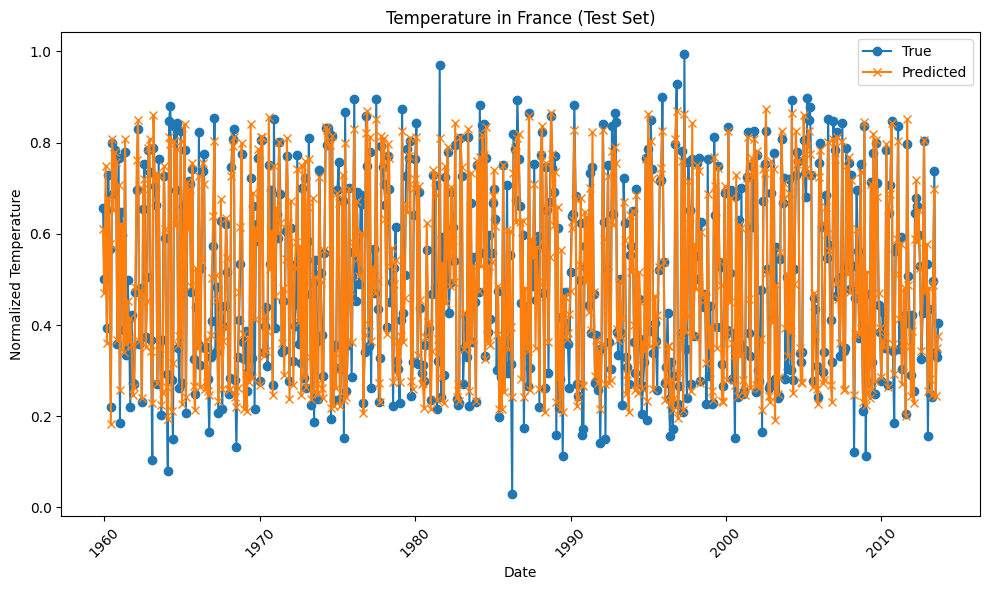

In [24]:
# first plot (very bad way to represent the data result) plot everything (normalize and all the data/prediction/true value)
plt.figure(figsize=(10, 6))
plt.plot(test_dates, true_values, label='True', marker='o')
plt.plot(test_dates, predictions, label='Predicted', marker='x')
plt.xlabel('Date')
plt.ylabel('Normalized Temperature')
plt.title('Temperature in France (Test Set)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [25]:
# Computes scalar similarity (cosine similarity) between true and predicted values.
# Higher values indicate that adversarial predictions remain directionally aligned
# with the true values, suggesting stealthy and rational attacks!
def scalar_similarity(y_true, y_pred):
    numerator = np.dot(y_true, y_pred)
    denominator = np.linalg.norm(y_true) * np.linalg.norm(y_pred)
    if denominator == 0:
        return 0.0
    return numerator / denominator

In [26]:
true_values_denorm = true_values * (max_temp - min_temp) + min_temp
predictions_denorm = predictions * (max_temp - min_temp) + min_temp

true_values_denorm_month = pd.Series(true_values_denorm).rolling(window=12).mean()
predictions_denorm_month = pd.Series(predictions_denorm).rolling(window=12).mean()

LSTM | NA – Epsilon 0.00 – MAE: 1.1994 | SIM: 0.9908


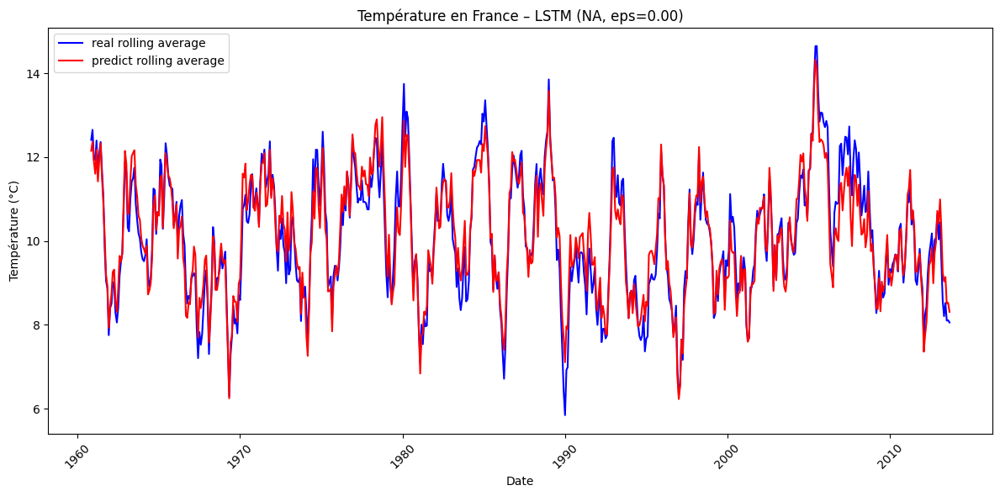

In [27]:
from utils.log_and_plot import log_and_plot_predictions

log_and_plot_predictions(
    true_values=true_values_denorm,
    predictions=predictions_denorm,
    test_dates=test_dates,
    true_values_rolling=true_values_denorm_month,
    predictions_rolling=predictions_denorm_month,
    model_name='LSTM',
    attack_name='NA',
    epsilon=0.00,
    res_tab=res_tab_temp,
    similarity_fn=scalar_similarity
)

## Adversial part

In [28]:
# func for denormalize the data
def denormalize(data, min_val, max_val):
    return data * (max_val - min_val) + min_val

In [29]:
from attacks.fgsm import fgsm_attack
from attacks.bim import bim_attack
from attacks.tca import tca_attack

In [30]:
from attacks.run_attack import *

LSTM | FGSM – Epsilon 0.01 – Adversarial MAE: 1.5304 | SIM: 0.9874


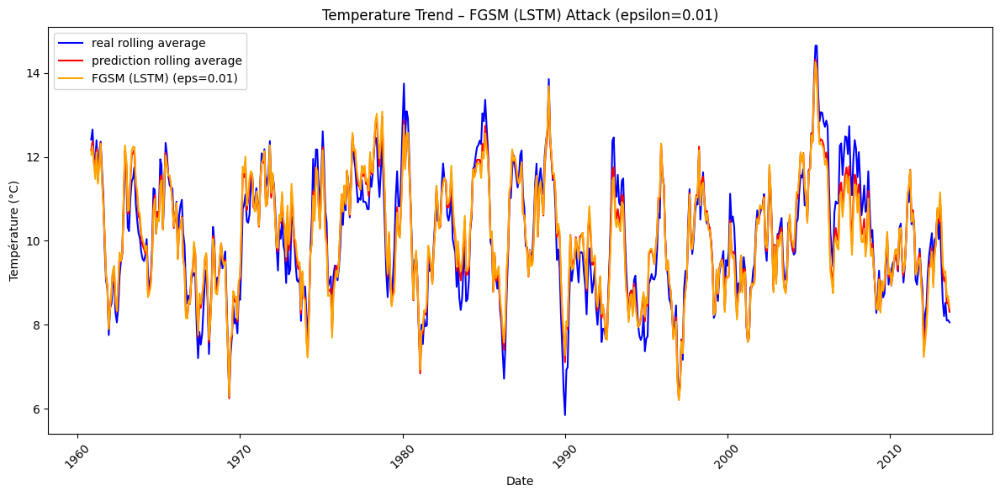

LSTM | FGSM – Epsilon 0.1 – Adversarial MAE: 4.4672 | SIM: 0.9234


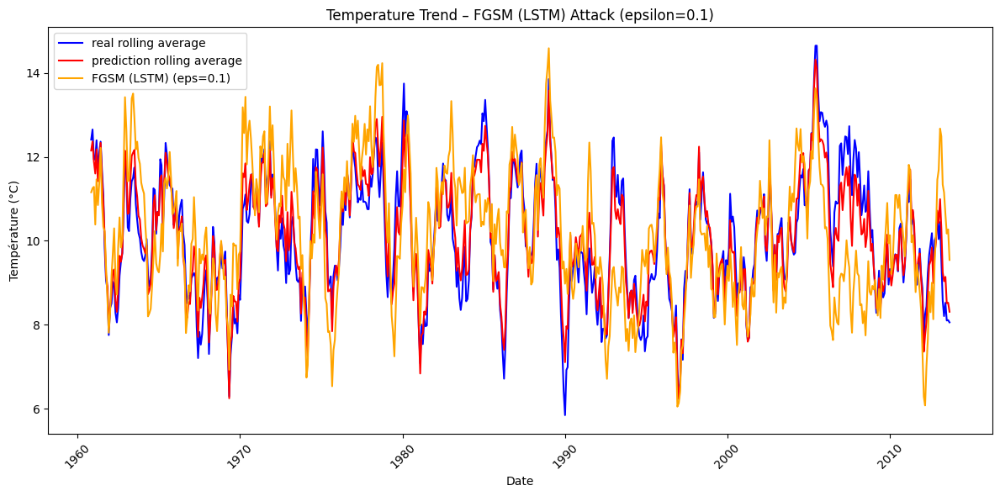

LSTM | FGSM – Epsilon 0.2 – Adversarial MAE: 7.5036 | SIM: 0.8129


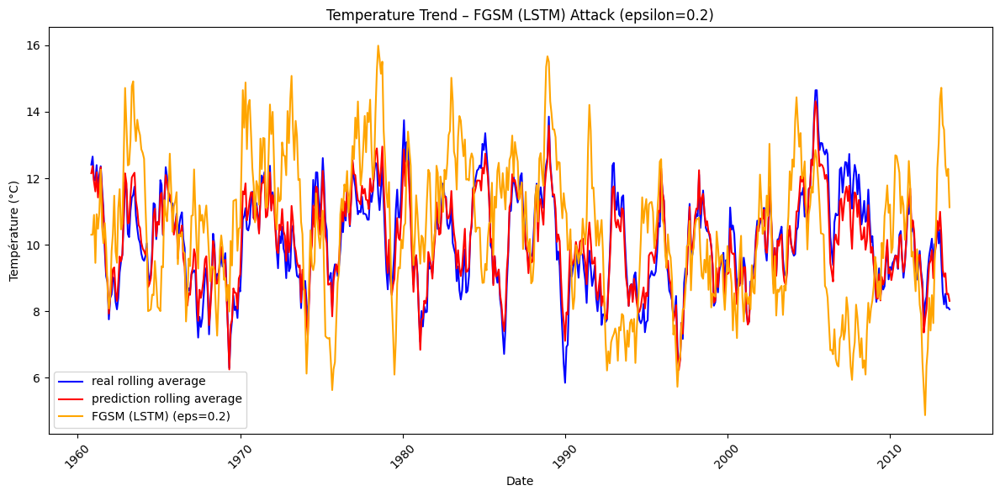

LSTM | BIM – Epsilon 0.01 – Adversarial MAE: 1.5304 | SIM: 0.9874


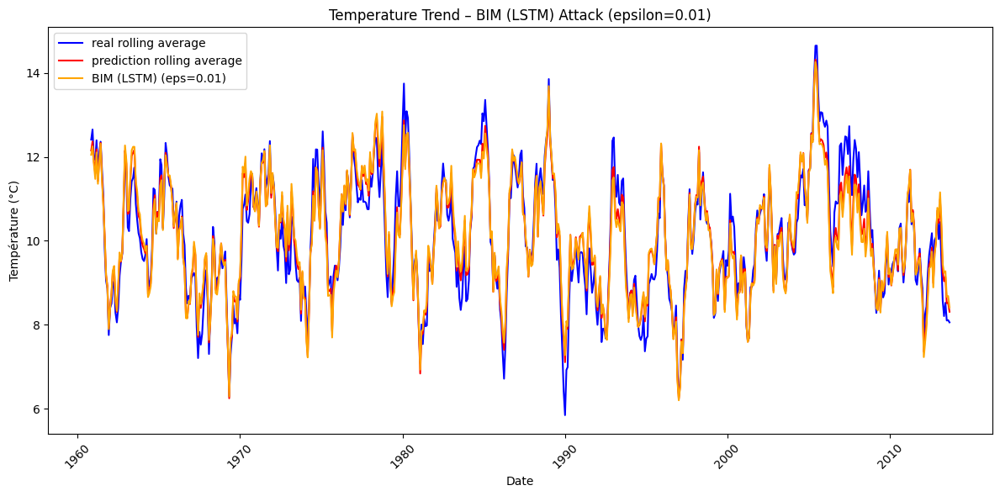

LSTM | BIM – Epsilon 0.1 – Adversarial MAE: 4.4776 | SIM: 0.9231


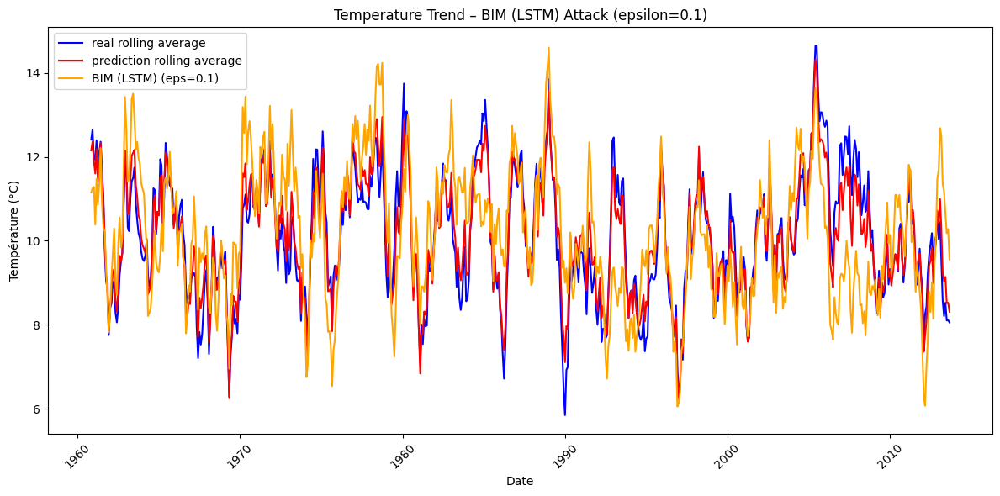

LSTM | BIM – Epsilon 0.2 – Adversarial MAE: 7.4905 | SIM: 0.8122


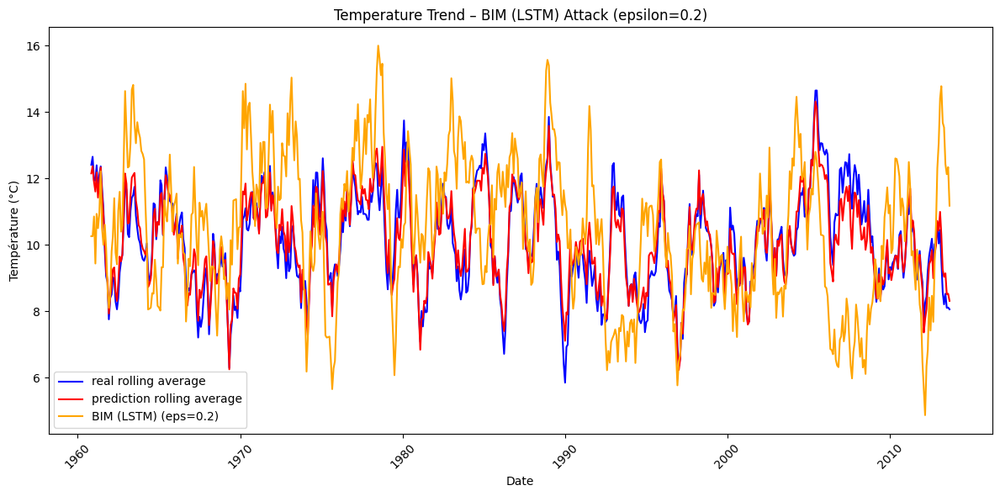

LSTM | TCA – Epsilon 0.01 – Adversarial MAE: 1.2254 | SIM: 0.9906


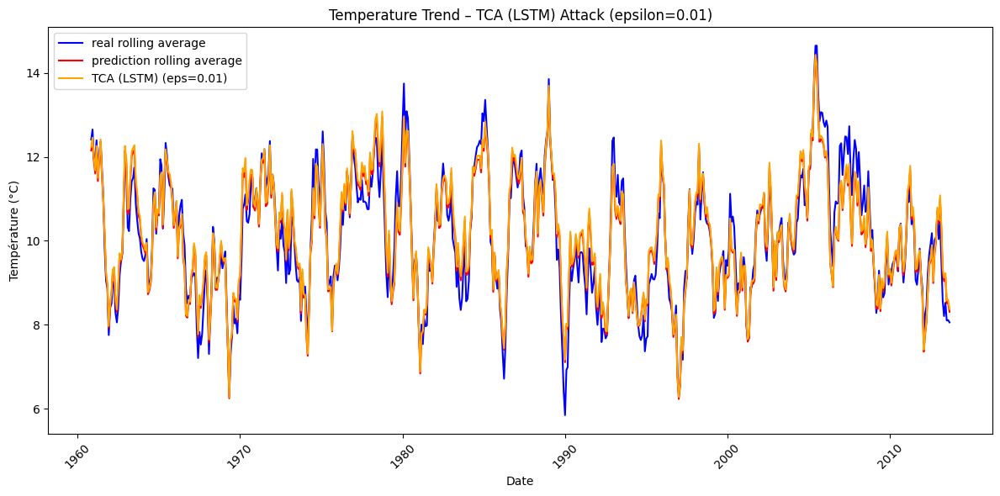

LSTM | TCA – Epsilon 0.1 – Adversarial MAE: 1.7032 | SIM: 0.9878


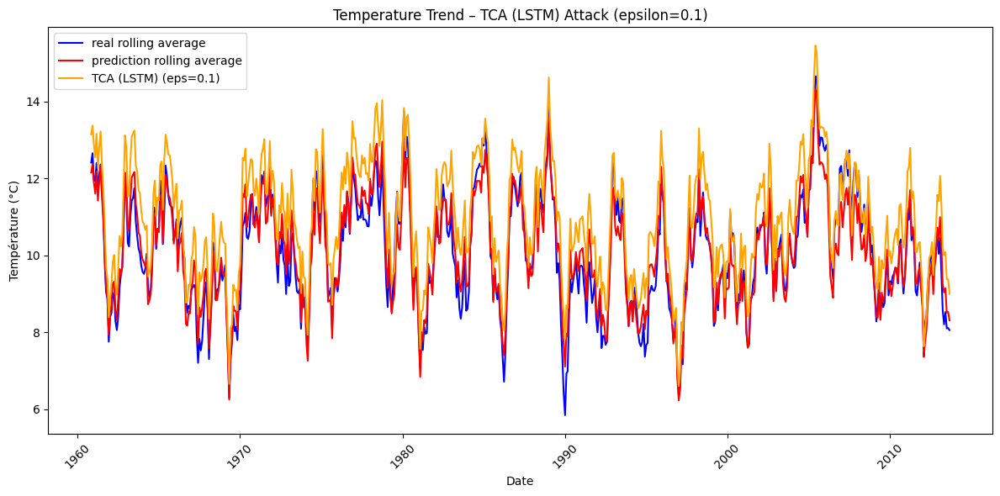

LSTM | TCA – Epsilon 0.2 – Adversarial MAE: 2.6446 | SIM: 0.9865


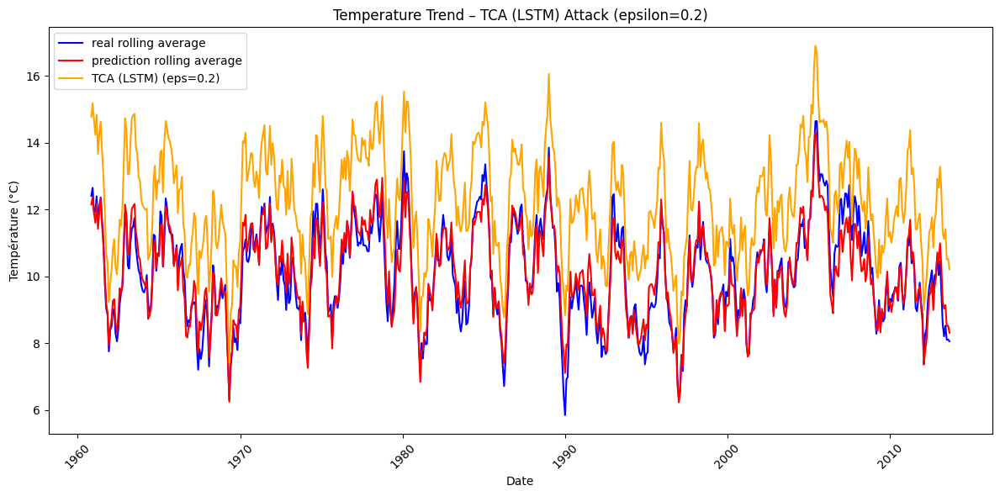

In [31]:
epsilon_values = [0.01, 0.1, 0.2]
alpha = 0.01
iters = 20

# FGSM
run_and_log_attack(
    model,'LSTM', loss_fn, test_loader, fgsm_attack, "FGSM",
    epsilon_values, min_temp, max_temp, predictions, test_dates, res_tab_temp
)

# BIM
run_and_log_attack(
    model,'LSTM', loss_fn, test_loader, bim_attack, "BIM",
    epsilon_values, min_temp, max_temp, predictions, test_dates, res_tab_temp,
    alpha=alpha, num_iter=iters
)

# TCA
run_and_log_attack(
    model,'LSTM', loss_fn, test_loader, tca_attack, "TCA",
    epsilon_values, min_temp, max_temp, predictions, test_dates, res_tab_temp,
    alpha=alpha, num_iter=iters
)


## RNN PART

In [32]:
from models.rnn import SimpleRNN

In [33]:
model_temp_RNN = SimpleRNN(input_size=1, hidden_size=64, output_size=1, num_layers=2)
loss_fn = nn.MSELoss() #loss function
optimizer = torch.optim.Adam(model_temp_RNN.parameters(), lr=0.001) #optimize (adam)
num_epochs = 10
train_model(model_temp_RNN,loss_fn,optimizer,num_epochs,train_loader)

Epoch 1/10, Loss: 0.0297
Epoch 2/10, Loss: 0.0049
Epoch 3/10, Loss: 0.0045
Epoch 4/10, Loss: 0.0044
Epoch 5/10, Loss: 0.0042
Epoch 6/10, Loss: 0.0041
Epoch 7/10, Loss: 0.0040
Epoch 8/10, Loss: 0.0040
Epoch 9/10, Loss: 0.0039
Epoch 10/10, Loss: 0.0042


In [34]:
from utils.eval import evaluate_model

model_temp_RNN.eval()
results = evaluate_model(model_temp_RNN, test_loader, train_size, dates)
test_dates = results["test_dates"]
true_values = results["true_values"]
predictions = results["predictions"]
for name, value in results["metrics"].items():
    print(f"{name}: {value:.4f}")

MAE: 0.0514
MSE: 0.0041
RMSE: 0.0644
R2: 0.9107


RNN | NA – Epsilon 0.00 – MAE: 1.3807 | SIM: 0.9900


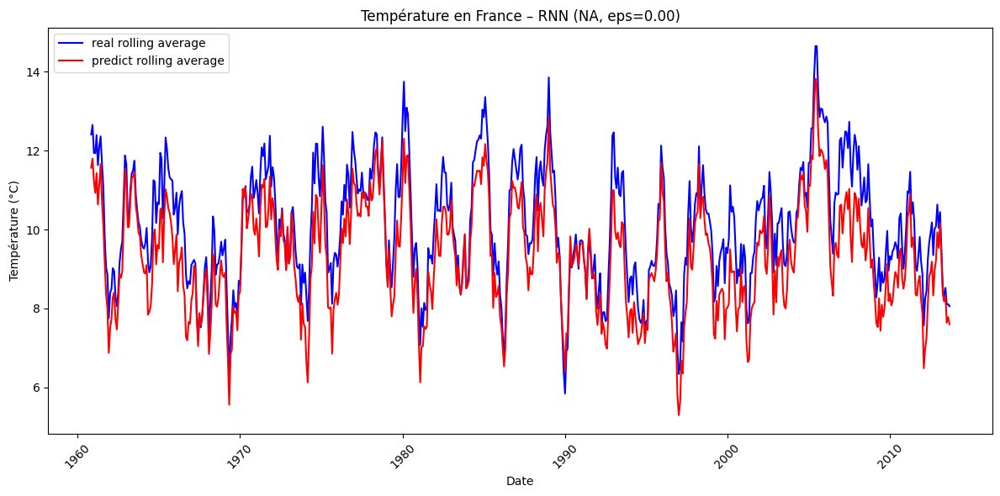

In [35]:
true_values_denorm = true_values * (max_temp - min_temp) + min_temp
predictions_denorm = predictions * (max_temp - min_temp) + min_temp

true_values_denorm_month = pd.Series(true_values_denorm).rolling(window=12).mean()
predictions_denorm_month = pd.Series(predictions_denorm).rolling(window=12).mean()

log_and_plot_predictions(
    true_values=true_values_denorm,
    predictions=predictions_denorm,
    test_dates=test_dates,
    true_values_rolling=true_values_denorm_month,
    predictions_rolling=predictions_denorm_month,
    model_name='RNN',
    attack_name='NA',
    epsilon=0.00,
    res_tab=res_tab_temp,
    similarity_fn=scalar_similarity
)

RNN | FGSM – Epsilon 0.01 – Adversarial MAE: 1.7084 | SIM: 0.9865


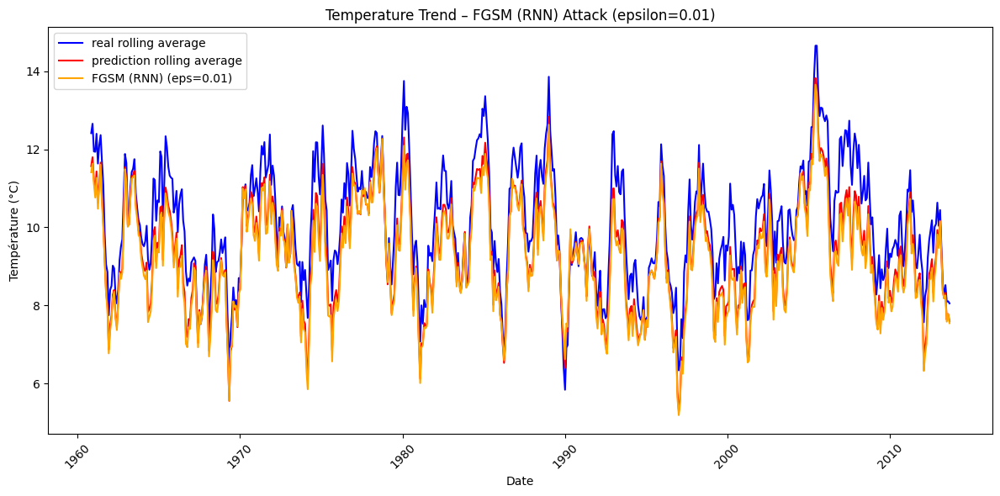

RNN | FGSM – Epsilon 0.1 – Adversarial MAE: 4.6453 | SIM: 0.9128


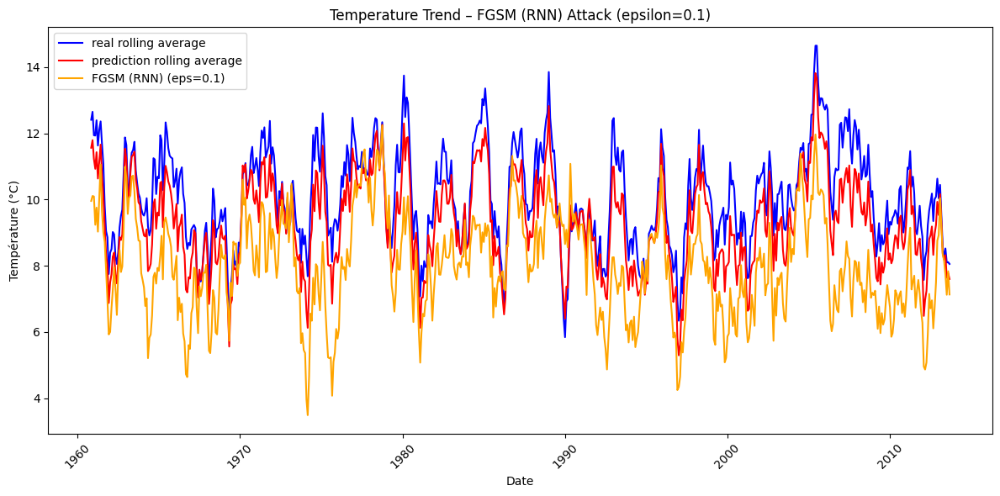

RNN | FGSM – Epsilon 0.2 – Adversarial MAE: 7.7960 | SIM: 0.7469


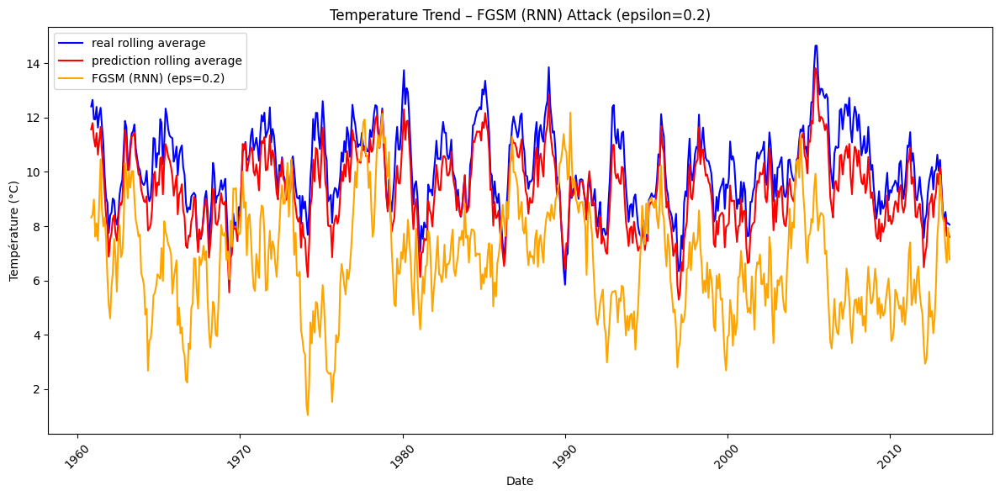

RNN | BIM – Epsilon 0.01 – Adversarial MAE: 1.7084 | SIM: 0.9865


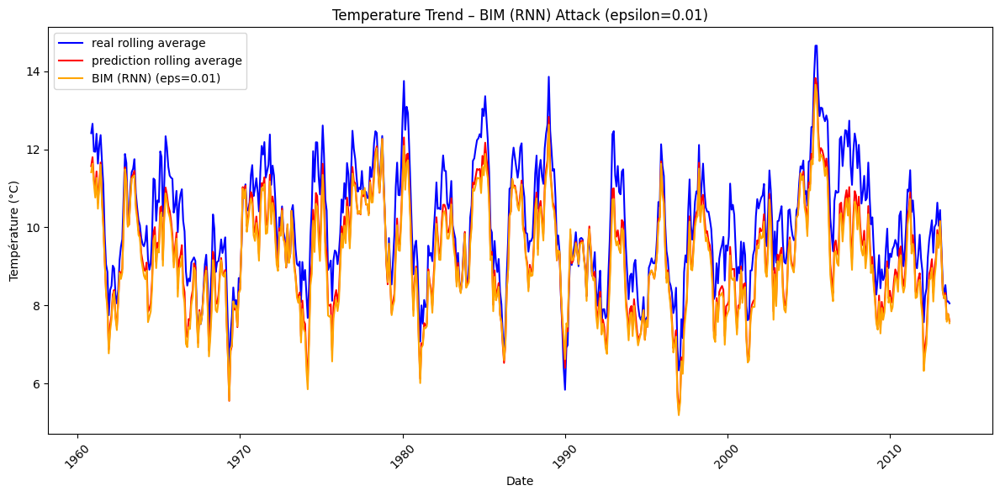

RNN | BIM – Epsilon 0.1 – Adversarial MAE: 4.6495 | SIM: 0.9127


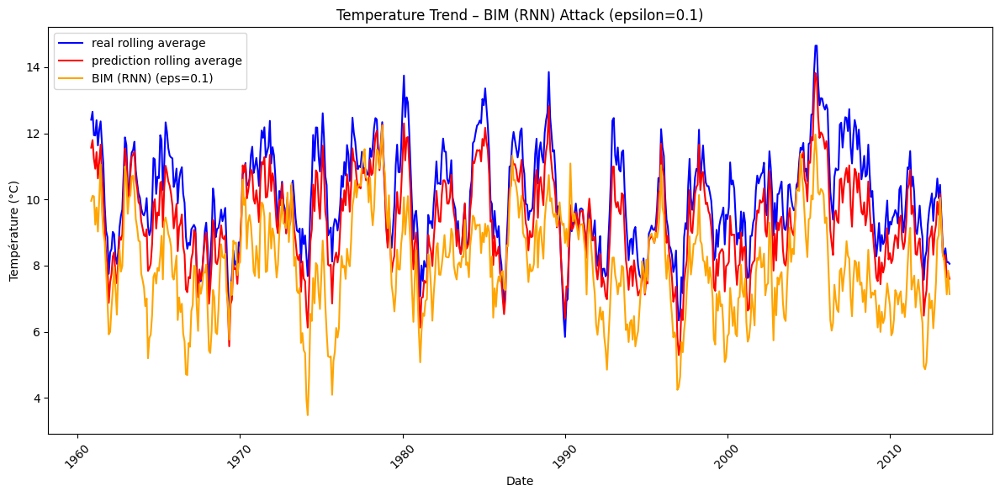

RNN | BIM – Epsilon 0.2 – Adversarial MAE: 7.7312 | SIM: 0.7498


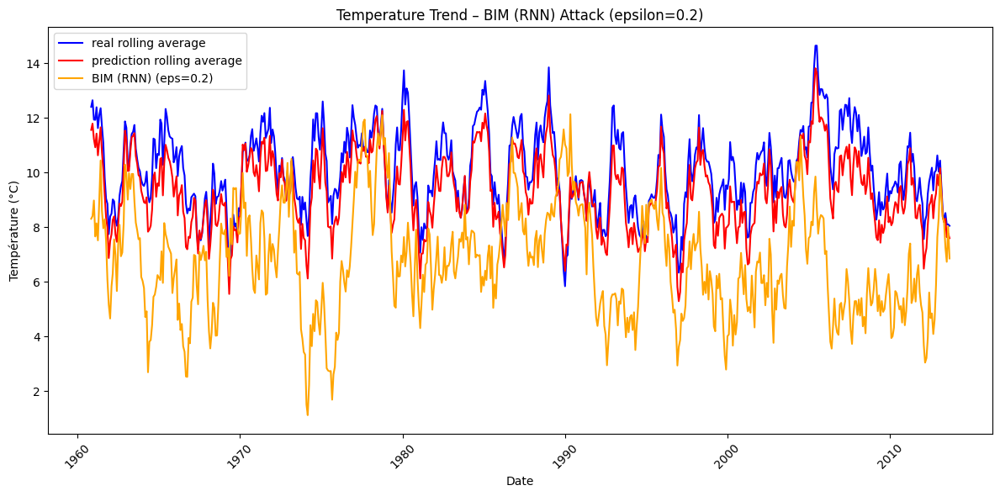

RNN | TCA – Epsilon 0.01 – Adversarial MAE: 1.3676 | SIM: 0.9898


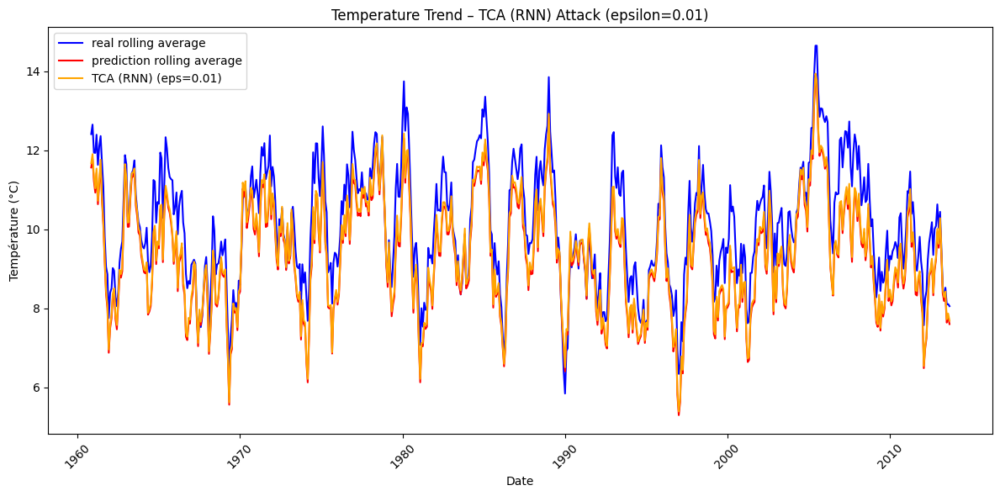

RNN | TCA – Epsilon 0.1 – Adversarial MAE: 1.5927 | SIM: 0.9873


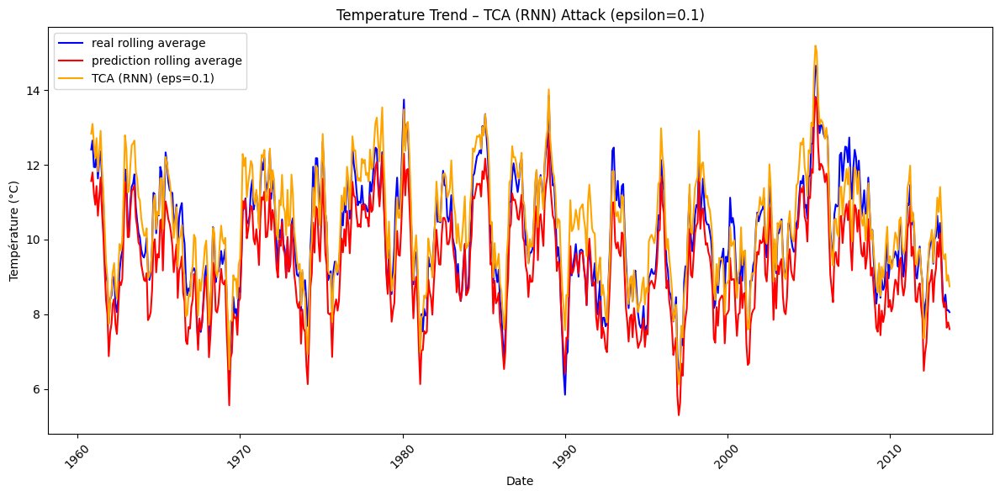

RNN | TCA – Epsilon 0.2 – Adversarial MAE: 2.4161 | SIM: 0.9855


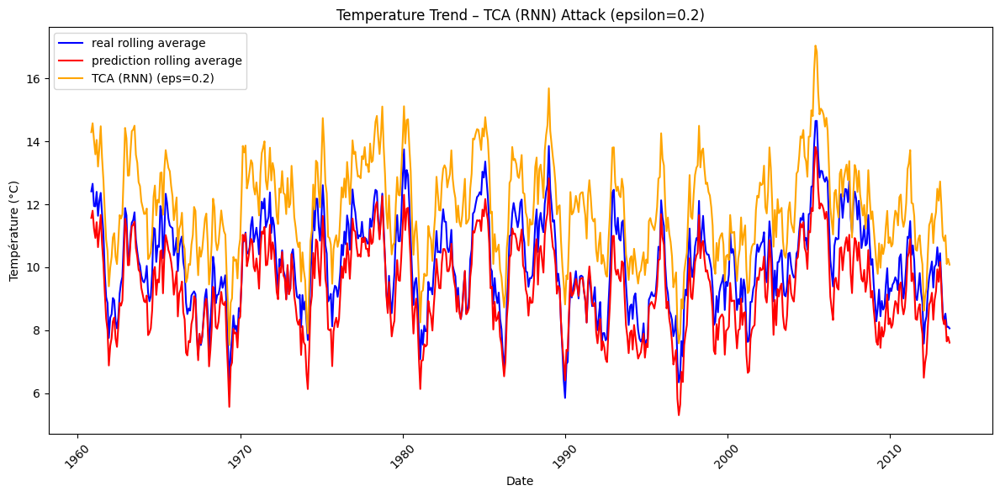

In [36]:
# FGSM
run_and_log_attack(
    model_temp_RNN, 'RNN', loss_fn, test_loader, fgsm_attack, "FGSM",
    epsilon_values, min_temp, max_temp, predictions, test_dates, res_tab_temp
)

# BIM
run_and_log_attack(
    model_temp_RNN, 'RNN', loss_fn, test_loader, bim_attack, "BIM",
    epsilon_values, min_temp, max_temp, predictions, test_dates, res_tab_temp,
    alpha=alpha, num_iter=iters
)

# TCA
run_and_log_attack(
    model_temp_RNN, 'RNN', loss_fn, test_loader, tca_attack, "TCA",
    epsilon_values, min_temp, max_temp, predictions, test_dates, res_tab_temp,
    alpha=alpha, num_iter=iters
)


## CNN PART

In [37]:
from models.cnn import SimpleCNN

In [38]:
model_temp_CNN = SimpleCNN(input_channels=1, output_size=1)
loss_fn = nn.MSELoss() #loss function
optimizer = torch.optim.Adam(model_temp_CNN.parameters(), lr=0.001) #optimize (adam)
num_epochs = 10
train_model(model_temp_CNN,loss_fn,optimizer,num_epochs,train_loader)

Epoch 1/10, Loss: 0.0959
Epoch 2/10, Loss: 0.0317
Epoch 3/10, Loss: 0.0143
Epoch 4/10, Loss: 0.0126
Epoch 5/10, Loss: 0.0120
Epoch 6/10, Loss: 0.0116
Epoch 7/10, Loss: 0.0111
Epoch 8/10, Loss: 0.0106
Epoch 9/10, Loss: 0.0101
Epoch 10/10, Loss: 0.0097


In [39]:
from utils.eval import evaluate_model

model_temp_CNN.eval()
results = evaluate_model(model_temp_CNN, test_loader, train_size, dates)
test_dates = results["test_dates"]
true_values = results["true_values"]
predictions = results["predictions"]
for name, value in results["metrics"].items():
    print(f"{name}: {value:.4f}")

MAE: 0.0653
MSE: 0.0107
RMSE: 0.1032
R2: 0.7707


CNN | NA – Epsilon 0.00 – MAE: 1.7541 | SIM: 0.9712


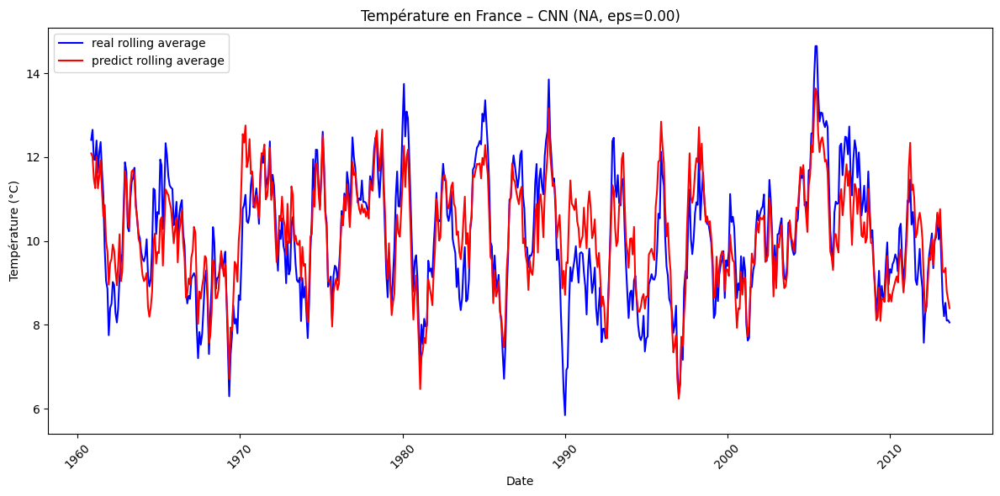

In [40]:
true_values_denorm = true_values * (max_temp - min_temp) + min_temp
predictions_denorm = predictions * (max_temp - min_temp) + min_temp

true_values_denorm_month = pd.Series(true_values_denorm).rolling(window=12).mean()
predictions_denorm_month = pd.Series(predictions_denorm).rolling(window=12).mean()

log_and_plot_predictions(
    true_values=true_values_denorm,
    predictions=predictions_denorm,
    test_dates=test_dates,
    true_values_rolling=true_values_denorm_month,
    predictions_rolling=predictions_denorm_month,
    model_name='CNN',
    attack_name='NA',
    epsilon=0.00,
    res_tab=res_tab_temp,
    similarity_fn=scalar_similarity
)

CNN | FGSM – Epsilon 0.01 – Adversarial MAE: 2.2287 | SIM: 0.9640


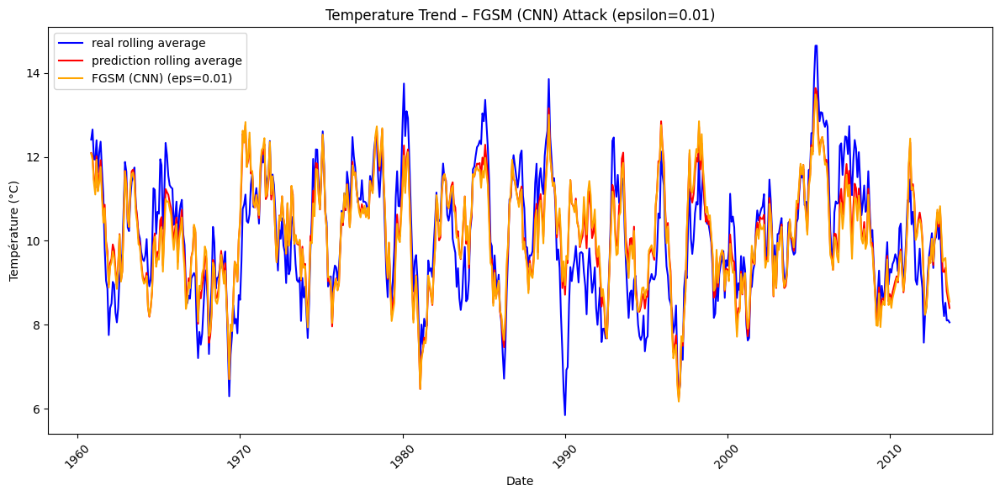

CNN | FGSM – Epsilon 0.1 – Adversarial MAE: 6.1957 | SIM: 0.8411


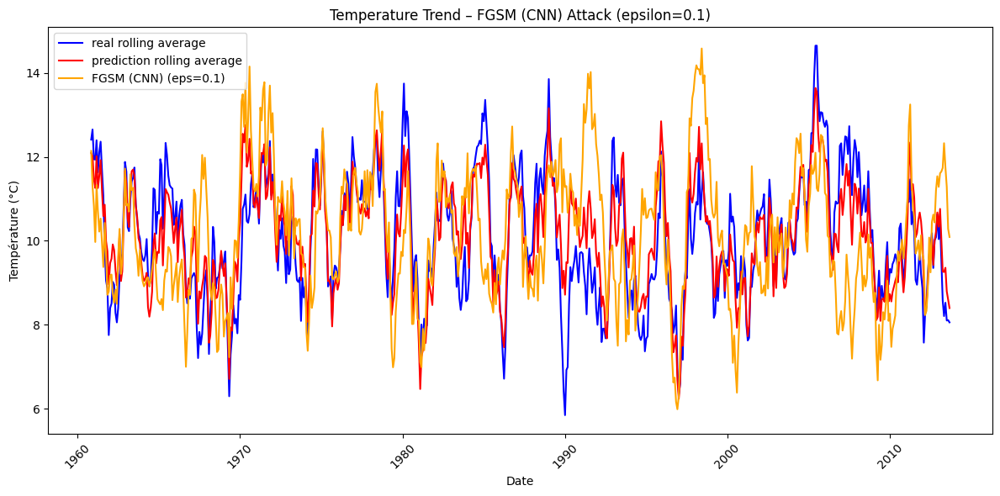

CNN | FGSM – Epsilon 0.2 – Adversarial MAE: 9.8716 | SIM: 0.6720


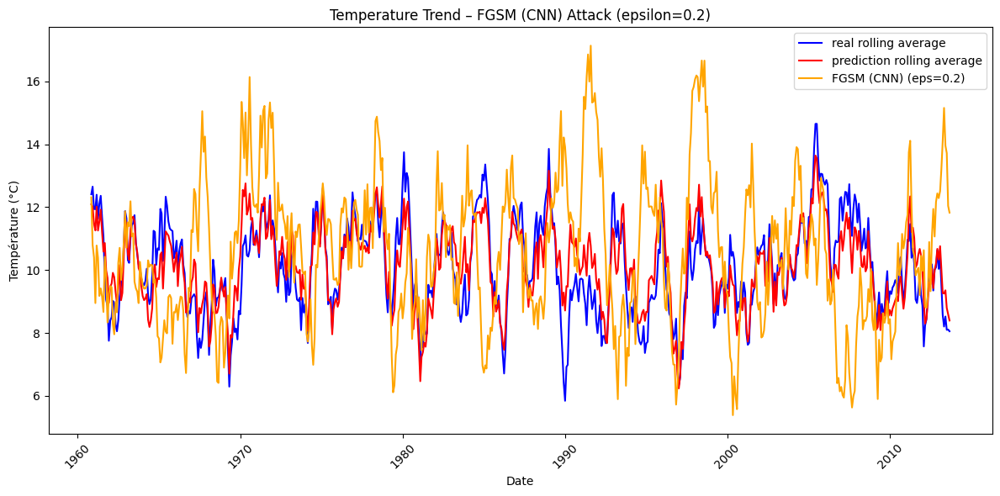

CNN | BIM – Epsilon 0.01 – Adversarial MAE: 2.2291 | SIM: 0.9640


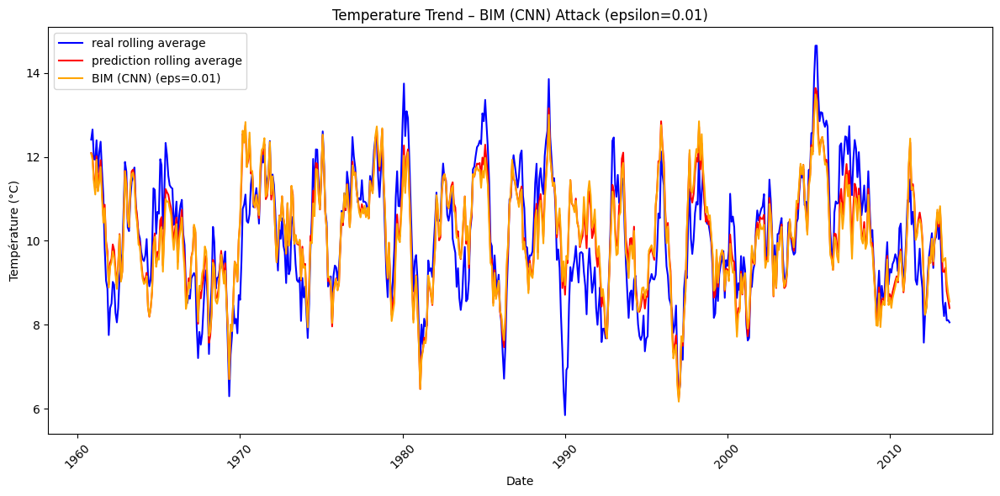

CNN | BIM – Epsilon 0.1 – Adversarial MAE: 6.3846 | SIM: 0.8331


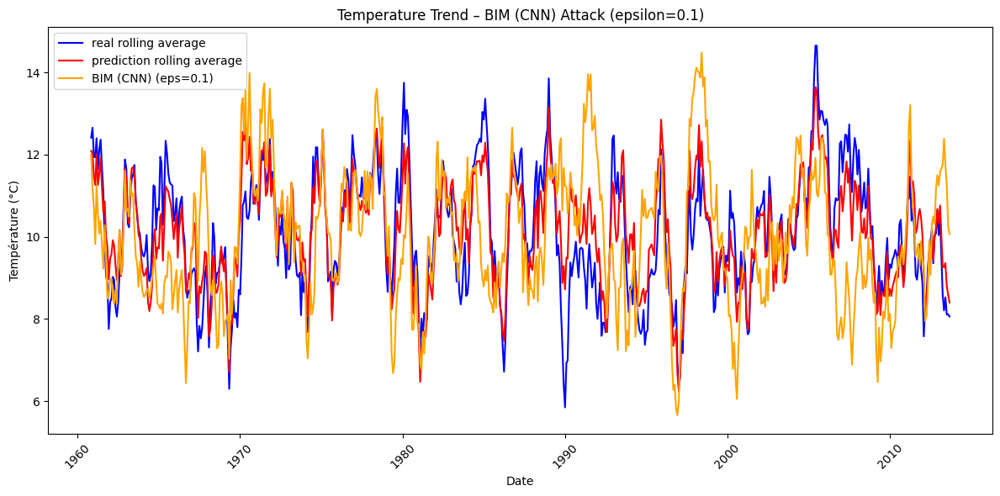

CNN | BIM – Epsilon 0.2 – Adversarial MAE: 10.4268 | SIM: 0.6398


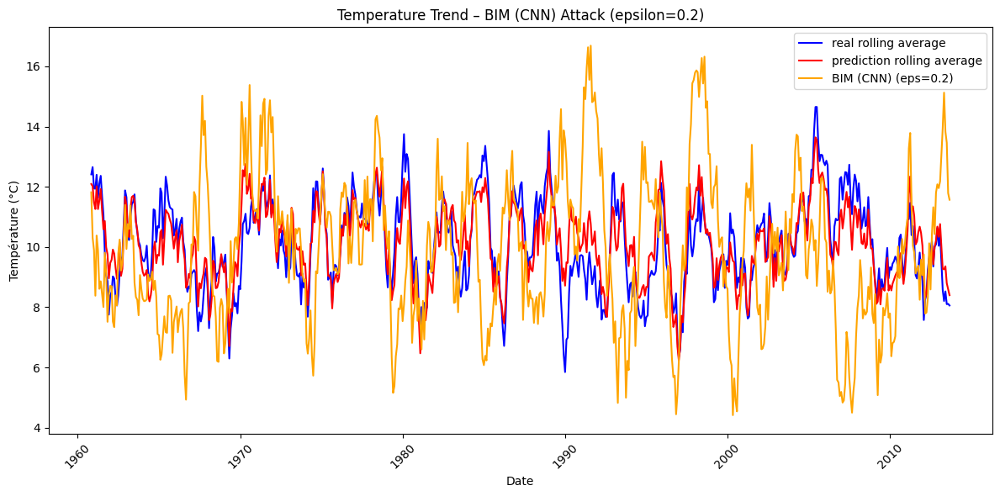

CNN | TCA – Epsilon 0.01 – Adversarial MAE: 1.8374 | SIM: 0.9704


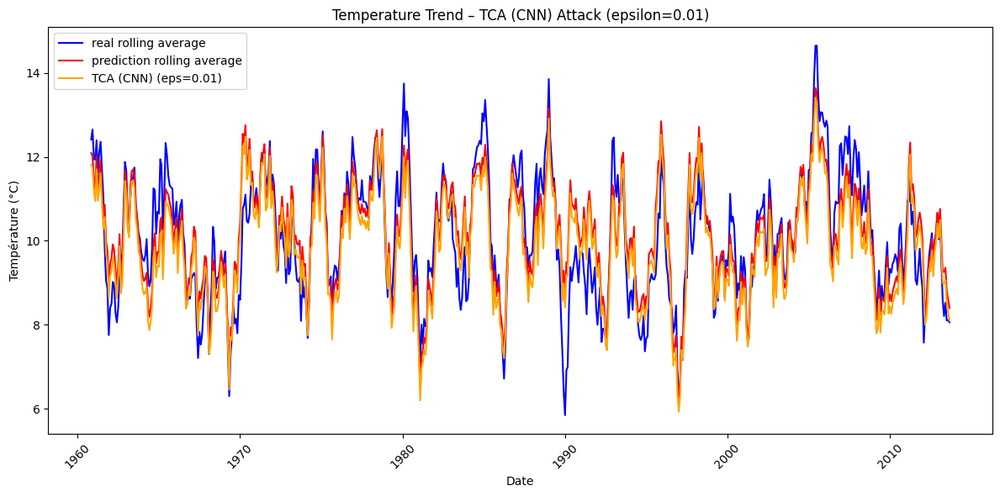

CNN | TCA – Epsilon 0.1 – Adversarial MAE: 3.6650 | SIM: 0.9524


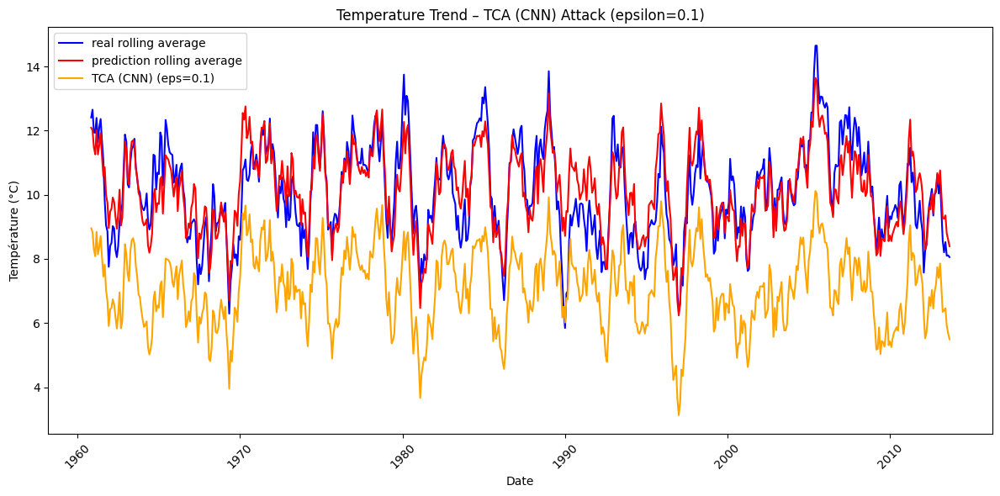

CNN | TCA – Epsilon 0.2 – Adversarial MAE: 6.3224 | SIM: 0.8908


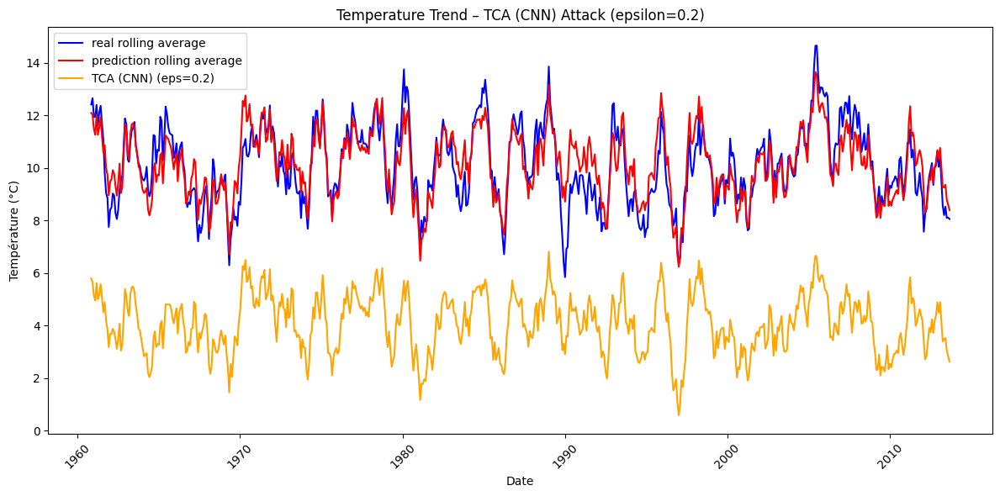

In [41]:
# FGSM
run_and_log_attack(
    model_temp_CNN, 'CNN', loss_fn, test_loader, fgsm_attack, "FGSM",
    epsilon_values, min_temp, max_temp, predictions, test_dates, res_tab_temp
)

# BIM
run_and_log_attack(
    model_temp_CNN, 'CNN', loss_fn, test_loader, bim_attack, "BIM",
    epsilon_values, min_temp, max_temp, predictions, test_dates, res_tab_temp,
    alpha=alpha, num_iter=iters
)

# TCA
run_and_log_attack(
    model_temp_CNN, 'CNN', loss_fn, test_loader, tca_attack, "TCA",
    epsilon_values, min_temp, max_temp, predictions, test_dates, res_tab_temp,
    alpha=alpha, num_iter=iters
)


In [42]:
display(res_tab_temp)

Attack              NA      FGSM                            BIM            \
ε                 0.00      0.01      0.10       0.20      0.01      0.10   
Model Metric                                                                
LSTM  MAE     1.199427  1.530365  4.467243   7.503569  1.530389  4.477633   
      RSME    1.575730  1.840212  4.640858   7.749722  1.840227  4.650405   
      SIM     0.990777  0.987415  0.923394   0.812919  0.987415  0.923113   
RNN   MAE     1.380720  1.708356  4.645338   7.795950  1.708367  4.649496   
      RSME    1.731171  2.001513  4.766330   7.893937  2.001519  4.769501   
      SIM     0.989993  0.986533  0.912848   0.746869  0.986533  0.912723   
CNN   MAE     1.754083  2.228722  6.195737   9.871572  2.229105  6.384563   
      RSME    2.774411  3.095060  6.611590  10.344011  3.095304  6.762429   
      SIM     0.971155  0.963994  0.841071   0.672029  0.963988  0.833091   

Attack                        TCA                      
ε                  0.20      0.01      0.10      0.20  
Model Metric                                           
LSTM  MAE      7.490462  1.225400  1.703218  2.644569  
      RSME     7.739621  1.598548  2.069261  3.055027  
      SIM      0.812195  0.990555  0.987808  0.986488  
RNN   MAE      7.731229  1.367613  1.592670  2.416073  
      RSME     7.834004  1.716218  1.928404  2.794456  
      SIM      0.749843  0.989790  0.987348  0.985496  
CNN   MAE     10.426756  1.837438  3.665049  6.322440  
      RSME    10.741712  2.811450  4.263902  6.760933  
      SIM      0.639755  0.970376  0.952355  0.890789

The fact that there is a translation is good, because it implies that I satisfied the three main components mentioned in the paper:

*    Effectiveness

*    Stealthiness

*    Rationality


## Analysis and Question

* Something really strange is that both attacks (FGSM/BIM) have the same MAE/RSME value.
Does this imply that, under certain conditions, a BIM attack behaves just like an FGSM attack, since BIM is essentially multiple iterations of FGSM? I see on the paper (https://www.sciencedirect.com/science/article/abs/pii/S0957417424028173) that BIM get lot more MAE/RSME than FGSM so maybe the implementation of BIM is not good ?

* In a non-targeted TCA adversarial attack on stock data, why does the perturbation mainly manifest as a uniform upward shift (translation upwards)? Intuitively, since the attack’s goal is to just maximize the model’s loss without targeting a specific output, I would expect the perturbation to sometimes push predictions downwards or create more varied fluctuations. Why does the perturbation tend to be an increase rather than a decrease or a mix? I think maybe i get a miss understand of how TCA really work? After implementing CNN, it clear that i dont know why but now the translation is down shift??? So maybe I need one more time to look at the TCA attack to be sure that nothing is wrong in my implementation.

# SAME BUT WITH GOOGLE STOCK DATA

## LSMT PART

In [43]:
google_data = pd.read_csv("data/HistoricalData_1747091015337.csv")
google_data['Date'] = pd.to_datetime(google_data['Date'])
google_data = google_data.sort_values(by='Date')

In [44]:
from utils.google_stock.setup_google_stock_dataset import prepare_stock_dataset
sequence_length = 30
result = prepare_stock_dataset(google_data)

train_loader = result['train_loader']
val_loader = result['val_loader']
test_loader = result['test_loader']
train_size = result['train_size']
val_size = result['val_size']
min_max = result['min_max']
dates = result['dates']
price_min, price_max = min_max['Close/Last']


In [45]:
from utils.google_stock.train_with_validation import train_model_with_validation
model_google = SimpleLSTM(input_size=5, hidden_size=64, output_size=1, num_layers=2)
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model_google.parameters(), lr=0.01)
num_epochs = 10
train_model_with_validation(model_google, loss_fn, optimizer, num_epochs, train_loader, val_loader,sequence_length)

Epoch [1/10], Train Loss: 0.0559, Validation Loss: 0.0068
Epoch [2/10], Train Loss: 0.0027, Validation Loss: 0.0023
Epoch [3/10], Train Loss: 0.0017, Validation Loss: 0.0011
Epoch [4/10], Train Loss: 0.0013, Validation Loss: 0.0011
Epoch [5/10], Train Loss: 0.0010, Validation Loss: 0.0009
Epoch [6/10], Train Loss: 0.0010, Validation Loss: 0.0010
Epoch [7/10], Train Loss: 0.0011, Validation Loss: 0.0009
Epoch [8/10], Train Loss: 0.0009, Validation Loss: 0.0010
Epoch [9/10], Train Loss: 0.0010, Validation Loss: 0.0018
Epoch [10/10], Train Loss: 0.0010, Validation Loss: 0.0008


In [46]:
from utils.google_stock.google_eval import evaluate_model_google
results = evaluate_model_google(model_google, test_loader, dates, train_size, val_size)

real_values = results['real_values']
predicted_values = results['predicted_values']
test_dates = results['test_dates']


In [47]:
# Creation of the tab result for plotting adversial attack result
models = ['LSTM','RNN']
metrics = ['MAE', "RSME", 'SIM']

row_index = pd.MultiIndex.from_product([models, metrics], names=['Model', 'Metric'])

attacks = ['NA', 'FGSM', 'BIM', 'TCA']
epsilons = {
    'NA': [0],
    'FGSM': [0.01, 0.1, 0.2],
    'BIM': [0.01, 0.1, 0.2],
    'TCA': [0.01, 0.1, 0.2],
}

col_tuples = []
for atk, eps_list in epsilons.items():
    for eps in eps_list:
        col_tuples.append((atk, f"{eps:.2f}"))

col_index = pd.MultiIndex.from_tuples(col_tuples, names=['Attack', 'ε'])

res_tab = pd.DataFrame(index=row_index, columns=col_index, dtype=float)

print(res_tab)

Attack         NA FGSM            BIM            TCA          
ε            0.00 0.01 0.10 0.20 0.01 0.10 0.20 0.01 0.10 0.20
Model Metric                                                  
LSTM  MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RSME    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
RNN   MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RSME    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN


LSTM | NA – Epsilon 0.00 – MAE: 2.7203 | SIM: 0.9996


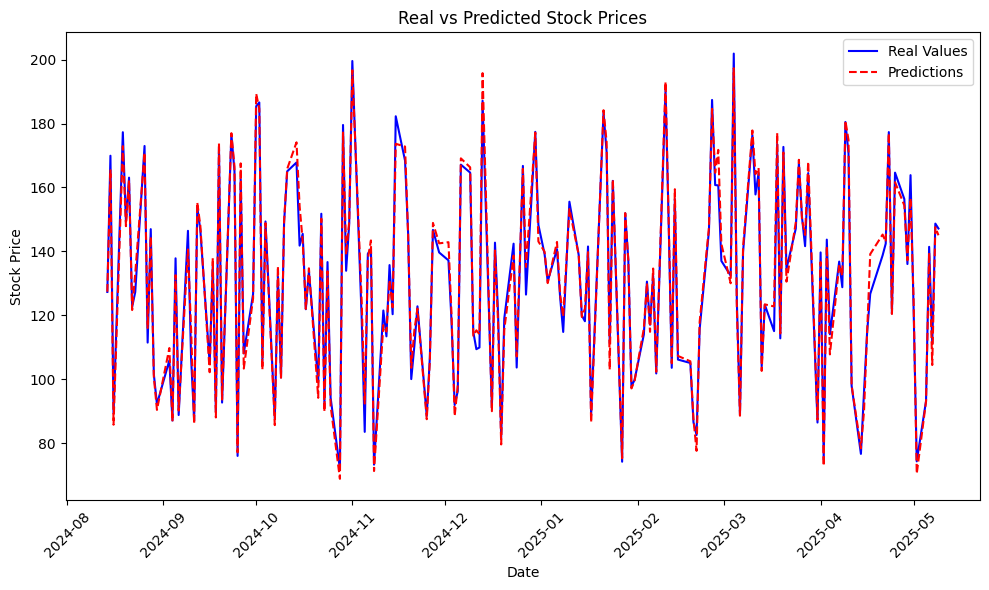

In [48]:
# Denormalize
true_values_denorm = real_values * (price_max - price_min) + price_min
predictions_denorm = predicted_values * (price_max - price_min) + price_min
mae = mean_absolute_error(true_values_denorm, predictions_denorm)
sim = scalar_similarity(true_values_denorm, predictions_denorm)
rsme = np.sqrt(mean_squared_error(true_values_denorm, predictions_denorm))

log_and_plot_predictions(
    true_values=true_values_denorm,
    predictions=predictions_denorm,
    test_dates=test_dates,
    true_values_rolling=true_values_denorm_month,
    predictions_rolling=predictions_denorm_month,
    model_name='LSTM',
    attack_name='NA',
    epsilon=0.00,
    res_tab=res_tab_temp,
    similarity_fn=scalar_similarity,
    google=True
)

FGSM – Epsilon 0.01 – Adversarial MAE: 4.2066 | SIM: 0.9994


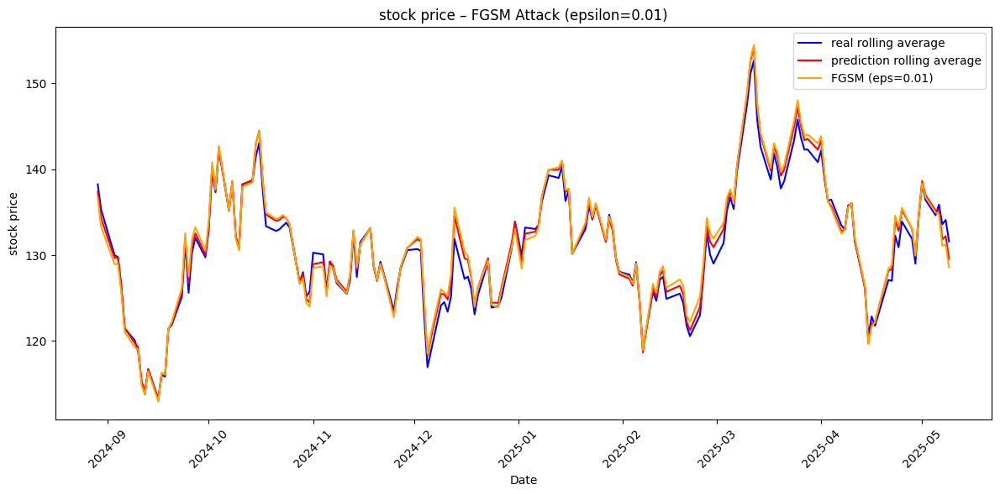

FGSM – Epsilon 0.1 – Adversarial MAE: 17.5105 | SIM: 0.9917


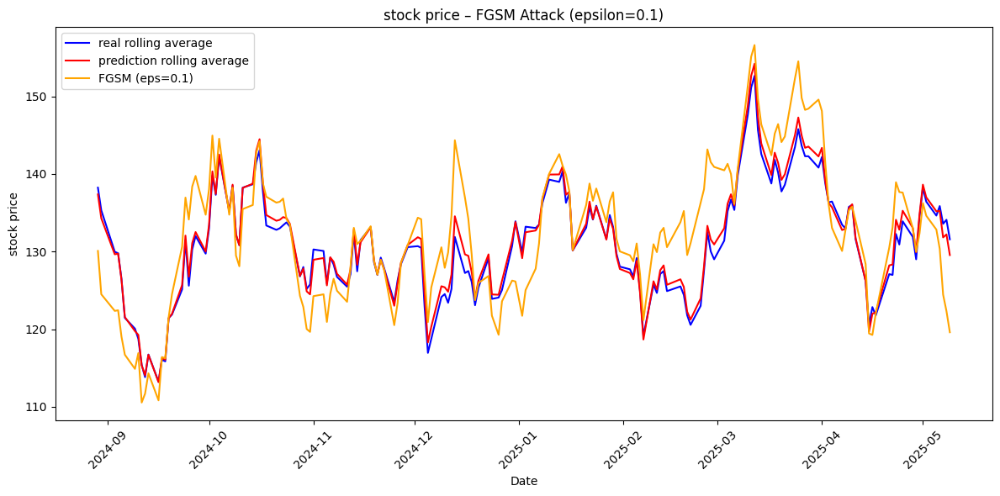

FGSM – Epsilon 0.2 – Adversarial MAE: 31.9386 | SIM: 0.9736


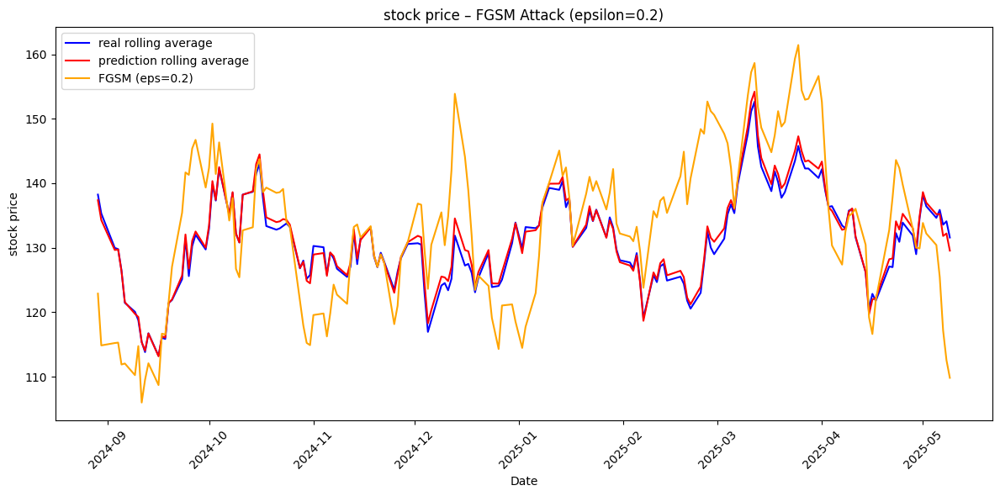

BIM – Epsilon 0.01 – Adversarial MAE: 4.2045 | SIM: 0.9994


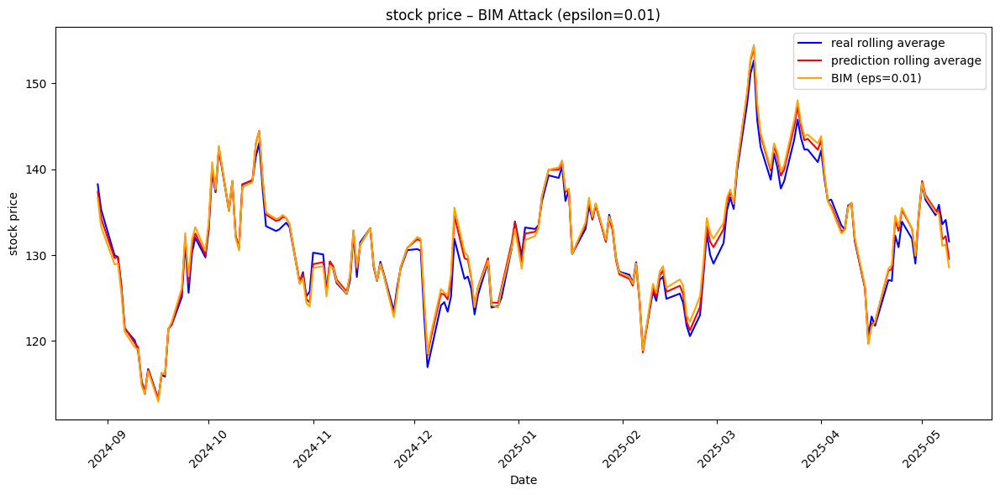

BIM – Epsilon 0.1 – Adversarial MAE: 17.2934 | SIM: 0.9918


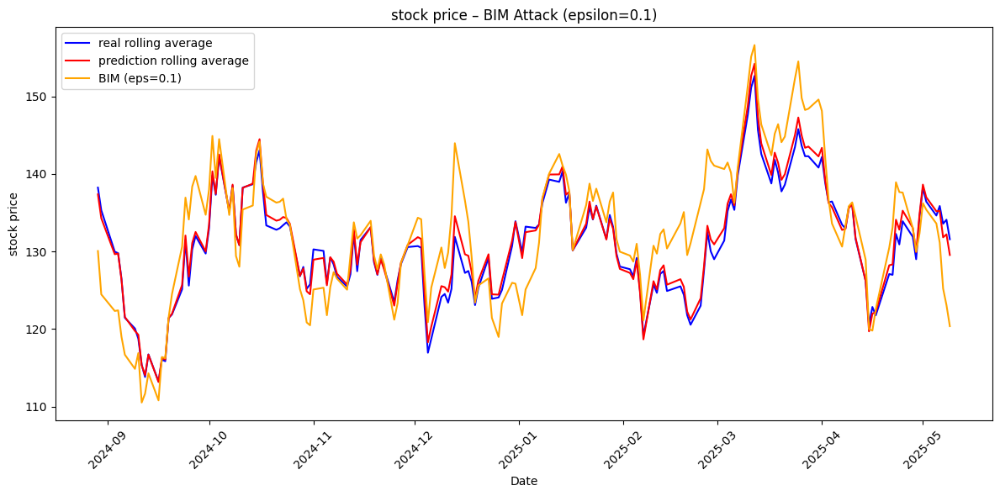

BIM – Epsilon 0.2 – Adversarial MAE: 30.7081 | SIM: 0.9751


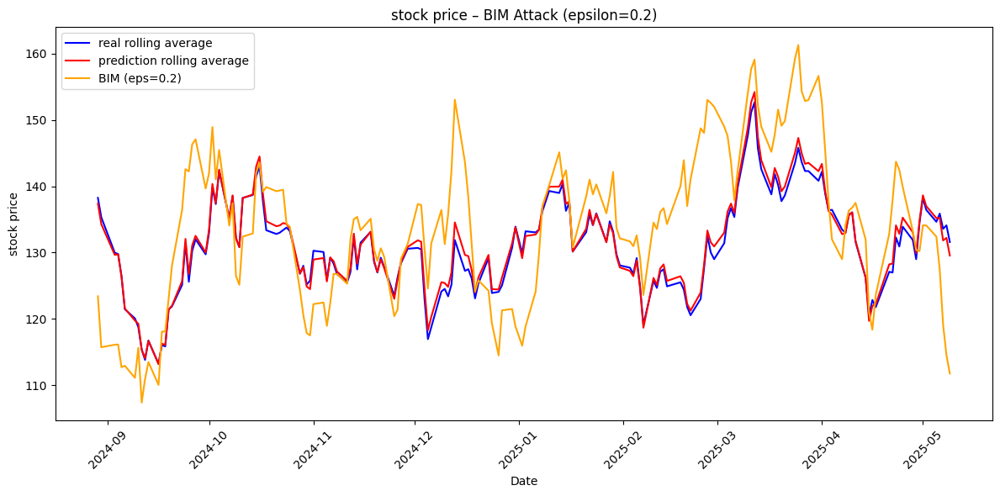

In [49]:
# just some test of adersial attack on google stock data set
# not the result on the result tab
from utils.google_stock.plot_attack_google import plot_rolling_attacks_google
epsilon_values = [0.01, 0.1, 0.2]
alpha = 0.01
iters = 40

# FGSM
for eps in epsilon_values:
    adv_preds, true_vals = run_attack(model_google, loss_fn, test_loader, fgsm_attack, epsilon=eps)
    adv_preds_denorm = denormalize(adv_preds, price_min, price_max)
    true_vals_denorm = denormalize(true_vals, price_min, price_max)

    mae = mean_absolute_error(true_vals_denorm, adv_preds_denorm)
    sim = scalar_similarity(true_vals_denorm, adv_preds_denorm)
    print(f"FGSM – Epsilon {eps} – Adversarial MAE: {mae:.4f} | SIM: {sim:.4f}")

    plot_rolling_attacks_google(test_dates, true_vals_denorm, predictions_denorm, adv_preds_denorm, label="FGSM", eps=eps)

# BIM
for eps in epsilon_values:
    adv_preds, true_vals = run_attack(model_google, loss_fn, test_loader, bim_attack, epsilon=eps, alpha=alpha, num_iter=iters)
    adv_preds_denorm = denormalize(adv_preds, price_min, price_max)
    true_vals_denorm = denormalize(true_vals, price_min, price_max)

    mae = mean_absolute_error(true_vals_denorm, adv_preds_denorm)
    sim = scalar_similarity(true_vals_denorm, adv_preds_denorm)
    print(f"BIM – Epsilon {eps} – Adversarial MAE: {mae:.4f} | SIM: {sim:.4f}")

    plot_rolling_attacks_google(test_dates, true_vals_denorm, predictions_denorm, adv_preds_denorm, label="BIM", eps=eps)

TCA – Epsilon 0.01 – Adversarial MAE: 3.1136 | SIM: 0.9996


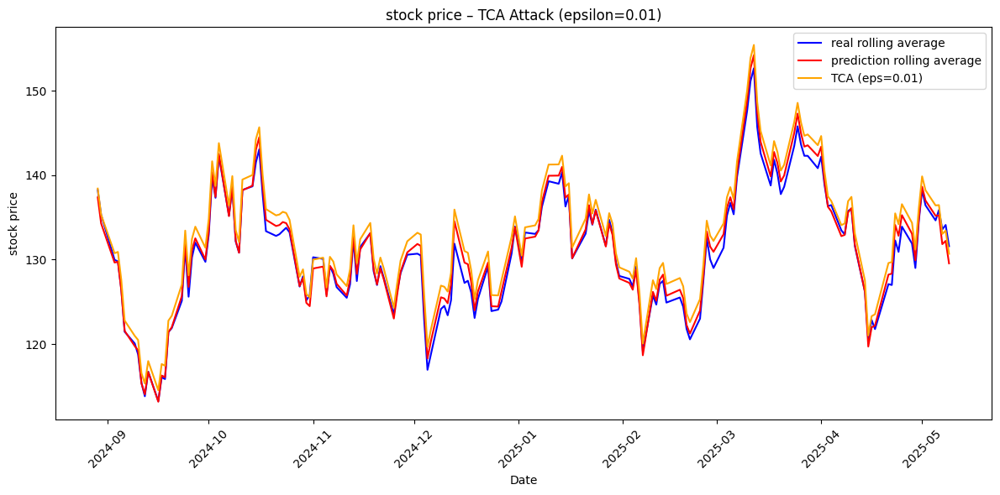

TCA – Epsilon 0.1 – Adversarial MAE: 14.2169 | SIM: 0.9995


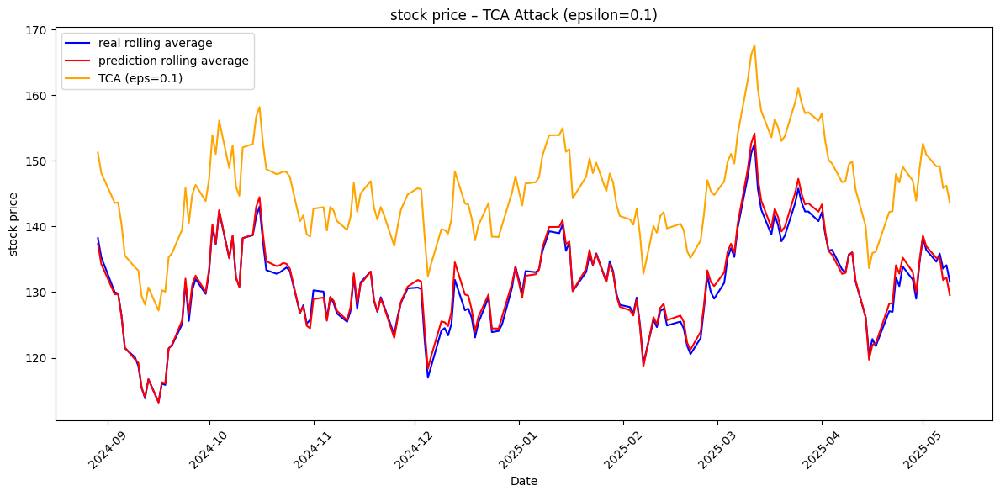

TCA – Epsilon 0.2 – Adversarial MAE: 28.0221 | SIM: 0.9988


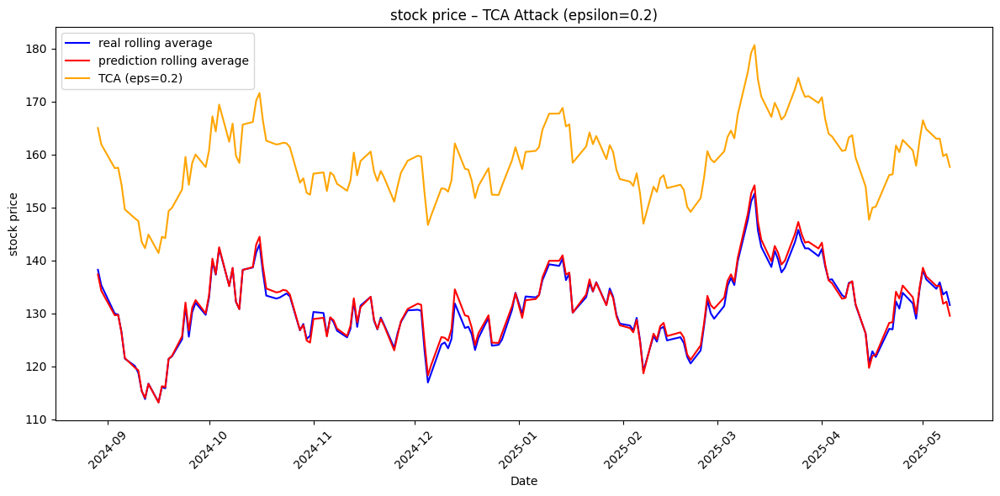

In [50]:
# TCA
epsilon_values = [0.01, 0.1, 0.2]
for eps in epsilon_values:
    adv_preds, true_vals = run_attack(model_google, loss_fn, test_loader, tca_attack, epsilon=eps)
    adv_preds_denorm = denormalize(adv_preds, price_min, price_max)
    true_vals_denorm = denormalize(true_vals, price_min, price_max)

    mae = mean_absolute_error(true_vals_denorm, adv_preds_denorm)
    sim = scalar_similarity(true_vals_denorm, adv_preds_denorm)
    print(f"TCA – Epsilon {eps} – Adversarial MAE: {mae:.4f} | SIM: {sim:.4f}")

    plot_rolling_attacks_google(test_dates, true_vals_denorm, predictions_denorm, adv_preds_denorm, label="TCA", eps=eps)

FGSM – Epsilon 0.01 – MAE: 4.2066 | SIM: 0.9994 | RSME: 4.8285
BIM – Epsilon 0.01 – MAE: 4.2045 | SIM: 0.9994 | RSME: 4.8250
TCA – Epsilon 0.01 – MAE: 3.1136 | SIM: 0.9996 | RSME: 4.0473


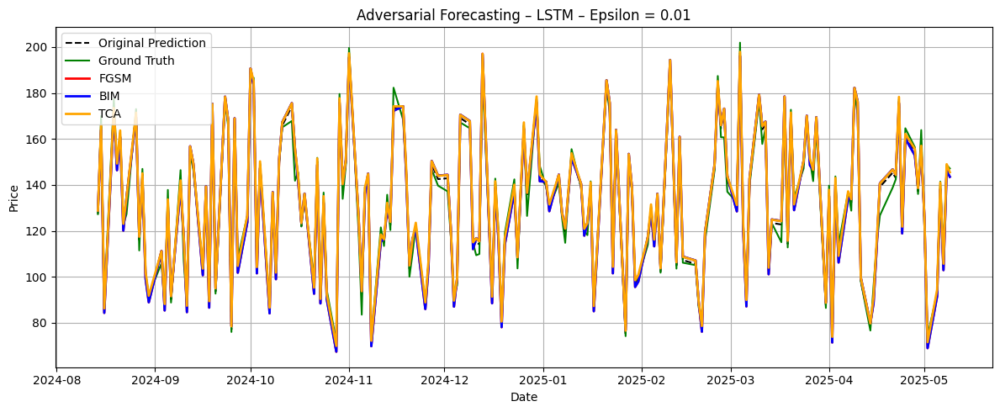

FGSM – Epsilon 0.10 – MAE: 17.5105 | SIM: 0.9917 | RSME: 17.6743
BIM – Epsilon 0.10 – MAE: 17.2805 | SIM: 0.9918 | RSME: 17.4954
TCA – Epsilon 0.10 – MAE: 14.2169 | SIM: 0.9995 | RSME: 14.6620


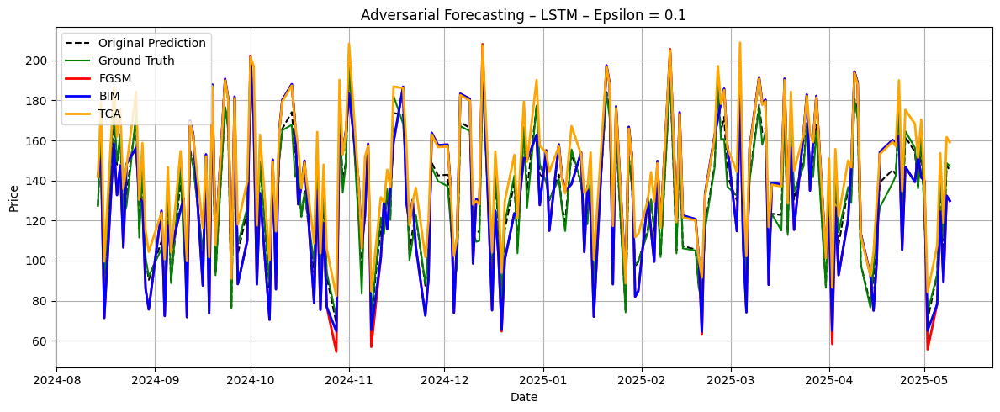

FGSM – Epsilon 0.20 – MAE: 31.9386 | SIM: 0.9736 | RSME: 32.0459
BIM – Epsilon 0.20 – MAE: 30.7063 | SIM: 0.9751 | RSME: 31.1312
TCA – Epsilon 0.20 – MAE: 28.0221 | SIM: 0.9988 | RSME: 28.2658


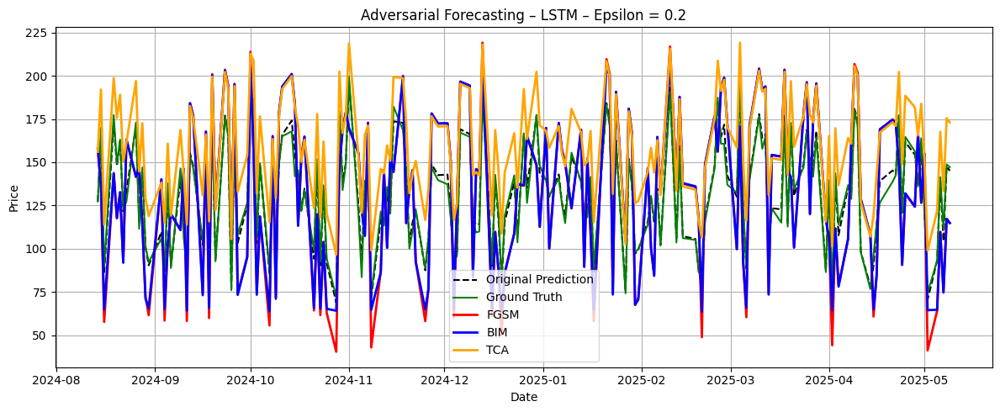

In [51]:
run_and_log_attack_google(
    model=model_google,
    model_name='LSTM',
    loss_fn=loss_fn,
    test_loader=test_loader,
    test_dates=test_dates,
    predictions_denorm=predictions_denorm,
    true_values_denorm=true_values_denorm,
    price_min=price_min,
    price_max=price_max,
    res_tab=res_tab
)


## RNN PART

In [52]:
model_google_RNN = SimpleRNN(input_size=5, hidden_size=64, output_size=1, num_layers=2)
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model_google_RNN.parameters(), lr=0.01)
num_epochs = 10
train_model_with_validation(model_google_RNN, loss_fn, optimizer, num_epochs, train_loader, val_loader,sequence_length)

Epoch [1/10], Train Loss: 0.0924, Validation Loss: 0.2813
Epoch [2/10], Train Loss: 0.1046, Validation Loss: 0.0191
Epoch [3/10], Train Loss: 0.0050, Validation Loss: 0.0012
Epoch [4/10], Train Loss: 0.0011, Validation Loss: 0.0010
Epoch [5/10], Train Loss: 0.0008, Validation Loss: 0.0009
Epoch [6/10], Train Loss: 0.0012, Validation Loss: 0.0015
Epoch [7/10], Train Loss: 0.0007, Validation Loss: 0.0009
Epoch [8/10], Train Loss: 0.0008, Validation Loss: 0.0012
Epoch [9/10], Train Loss: 0.0010, Validation Loss: 0.0010
Epoch [10/10], Train Loss: 0.0010, Validation Loss: 0.0018


In [53]:
from utils.google_stock.google_eval import evaluate_model_google
results = evaluate_model_google(model_google_RNN, test_loader, dates, train_size, val_size)

real_values = results['real_values']
predicted_values = results['predicted_values']
test_dates = results['test_dates']

RNN | NA – Epsilon 0.00 – MAE: 4.4869 | SIM: 0.9996


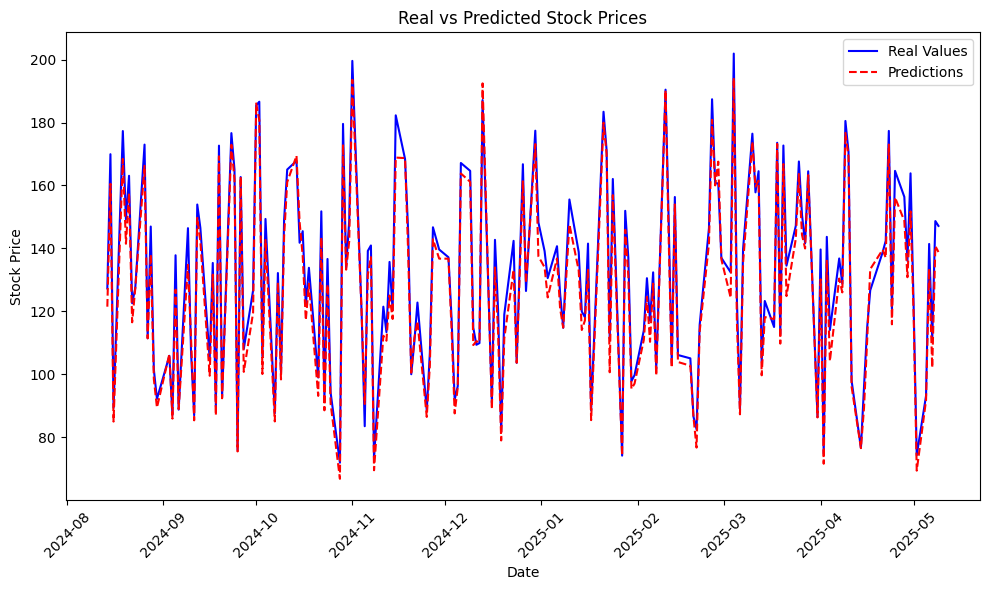

In [54]:
# Denormalize
true_values_denorm = real_values * (price_max - price_min) + price_min
predictions_denorm = predicted_values * (price_max - price_min) + price_min
mae = mean_absolute_error(true_values_denorm, predictions_denorm)
sim = scalar_similarity(true_values_denorm, predictions_denorm)
rsme = np.sqrt(mean_squared_error(true_values_denorm, predictions_denorm))

log_and_plot_predictions(
    true_values=true_values_denorm,
    predictions=predictions_denorm,
    test_dates=test_dates,
    true_values_rolling=true_values_denorm_month,
    predictions_rolling=predictions_denorm_month,
    model_name='RNN',
    attack_name='NA',
    epsilon=0.00,
    res_tab=res_tab_temp,
    similarity_fn=scalar_similarity,
    google=True
)

FGSM – Epsilon 0.01 – MAE: 5.8813 | SIM: 0.9995 | RSME: 6.5862
BIM – Epsilon 0.01 – MAE: 5.8792 | SIM: 0.9995 | RSME: 6.5843
TCA – Epsilon 0.01 – MAE: 3.7489 | SIM: 0.9996 | RSME: 4.5384


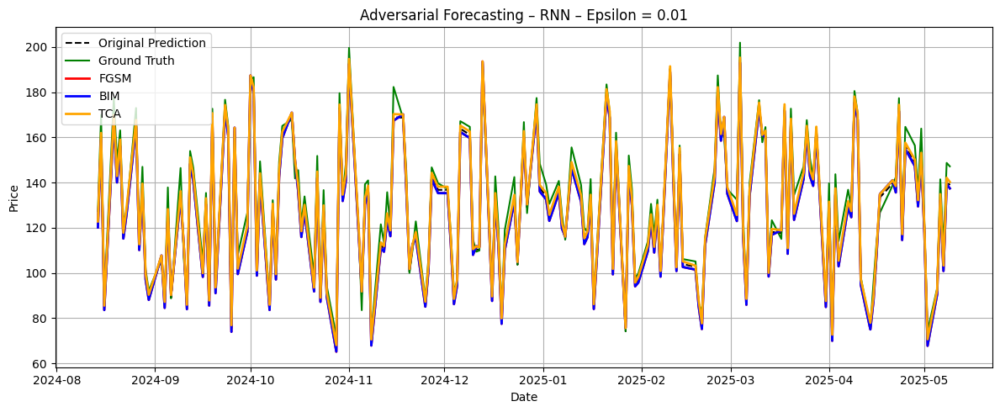

FGSM – Epsilon 0.10 – MAE: 18.5176 | SIM: 0.9951 | RSME: 18.7700
BIM – Epsilon 0.10 – MAE: 18.2042 | SIM: 0.9953 | RSME: 18.4968
TCA – Epsilon 0.10 – MAE: 9.3595 | SIM: 0.9995 | RSME: 10.0164


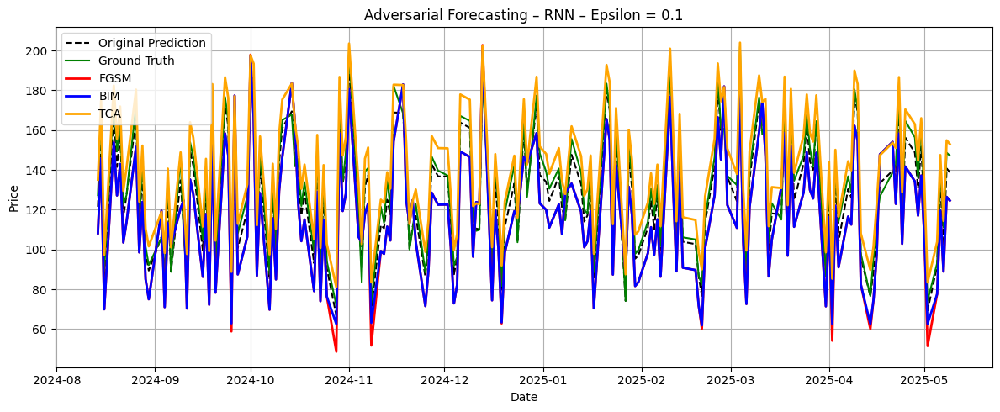

FGSM – Epsilon 0.20 – MAE: 33.0844 | SIM: 0.9857 | RSME: 33.2887
BIM – Epsilon 0.20 – MAE: 33.7088 | SIM: 0.9821 | RSME: 35.6541
TCA – Epsilon 0.20 – MAE: 22.5395 | SIM: 0.9990 | RSME: 22.8486


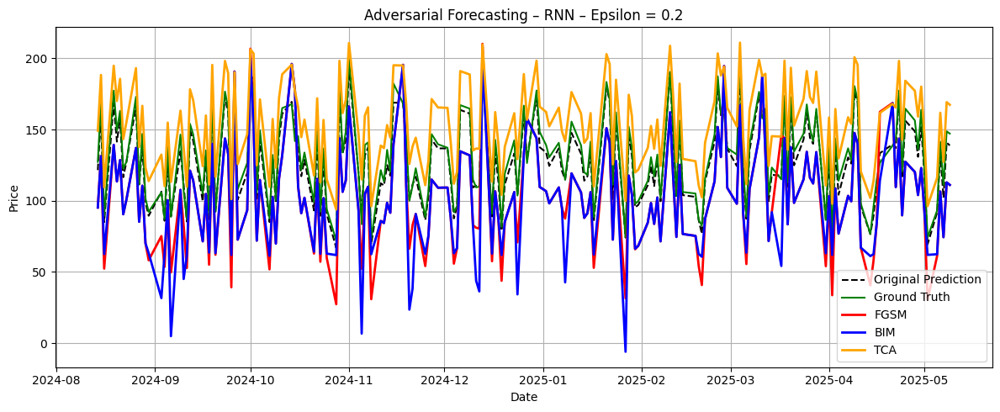

In [55]:
run_and_log_attack_google(
    model=model_google_RNN,
    model_name='RNN',
    loss_fn=loss_fn,
    test_loader=test_loader,
    test_dates=test_dates,
    predictions_denorm=predictions_denorm,
    true_values_denorm=true_values_denorm,
    price_min=price_min,
    price_max=price_max,
    res_tab=res_tab
)


## CNN PART

In [56]:
model_google_CNN = SimpleCNN(input_channels=5, output_size=1)
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model_google_CNN.parameters(), lr=0.01)
num_epochs = 10
train_model_with_validation(model_google_CNN, loss_fn, optimizer, num_epochs, train_loader, val_loader, sequence_length)

Epoch [1/10], Train Loss: 0.0190, Validation Loss: 0.0069
Epoch [2/10], Train Loss: 0.0033, Validation Loss: 0.0034
Epoch [3/10], Train Loss: 0.0030, Validation Loss: 0.0043
Epoch [4/10], Train Loss: 0.0035, Validation Loss: 0.0032
Epoch [5/10], Train Loss: 0.0028, Validation Loss: 0.0048
Epoch [6/10], Train Loss: 0.0030, Validation Loss: 0.0037
Epoch [7/10], Train Loss: 0.0027, Validation Loss: 0.0031
Epoch [8/10], Train Loss: 0.0030, Validation Loss: 0.0031
Epoch [9/10], Train Loss: 0.0028, Validation Loss: 0.0032
Epoch [10/10], Train Loss: 0.0028, Validation Loss: 0.0031


In [57]:
from utils.google_stock.google_eval import evaluate_model_google
results = evaluate_model_google(model_google_CNN, test_loader, dates, train_size, val_size)

real_values = results['real_values']
predicted_values = results['predicted_values']
test_dates = results['test_dates']

CNN | NA – Epsilon 0.00 – MAE: 6.0911 | SIM: 0.9985


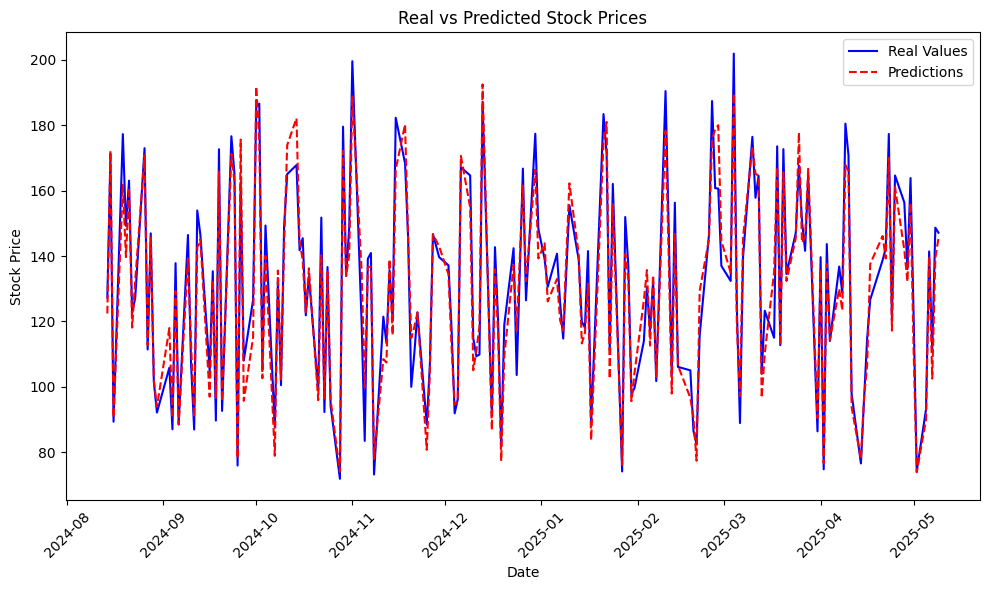

In [58]:
# Denormalize
true_values_denorm = real_values * (price_max - price_min) + price_min
predictions_denorm = predicted_values * (price_max - price_min) + price_min
mae = mean_absolute_error(true_values_denorm, predictions_denorm)
sim = scalar_similarity(true_values_denorm, predictions_denorm)
rsme = np.sqrt(mean_squared_error(true_values_denorm, predictions_denorm))

log_and_plot_predictions(
    true_values=true_values_denorm,
    predictions=predictions_denorm,
    test_dates=test_dates,
    true_values_rolling=true_values_denorm_month,
    predictions_rolling=predictions_denorm_month,
    model_name='CNN',
    attack_name='NA',
    epsilon=0.00,
    res_tab=res_tab_temp,
    similarity_fn=scalar_similarity,
    google=True
)

FGSM – Epsilon 0.01 – MAE: 7.6168 | SIM: 0.9980 | RSME: 8.7617
BIM – Epsilon 0.01 – MAE: 7.6154 | SIM: 0.9980 | RSME: 8.7601
TCA – Epsilon 0.01 – MAE: 6.0217 | SIM: 0.9985 | RSME: 7.4020


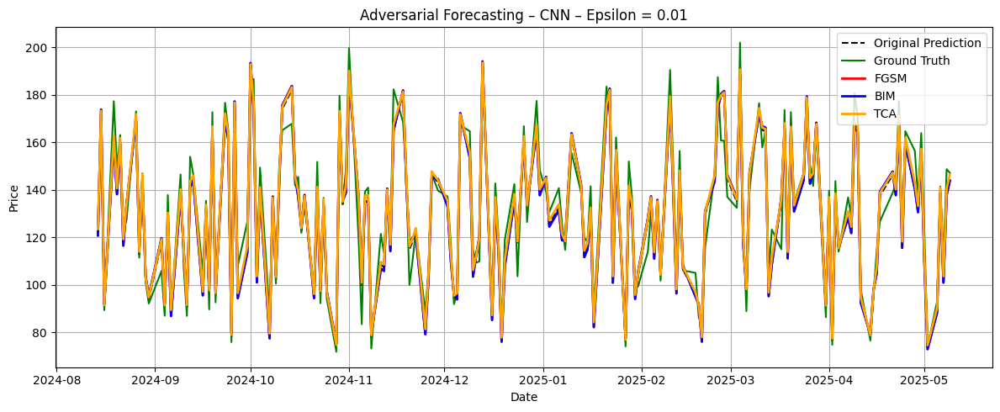

FGSM – Epsilon 0.10 – MAE: 21.3353 | SIM: 0.9869 | RSME: 21.8078
BIM – Epsilon 0.10 – MAE: 21.1596 | SIM: 0.9871 | RSME: 21.6632
TCA – Epsilon 0.10 – MAE: 10.0511 | SIM: 0.9983 | RSME: 12.1228


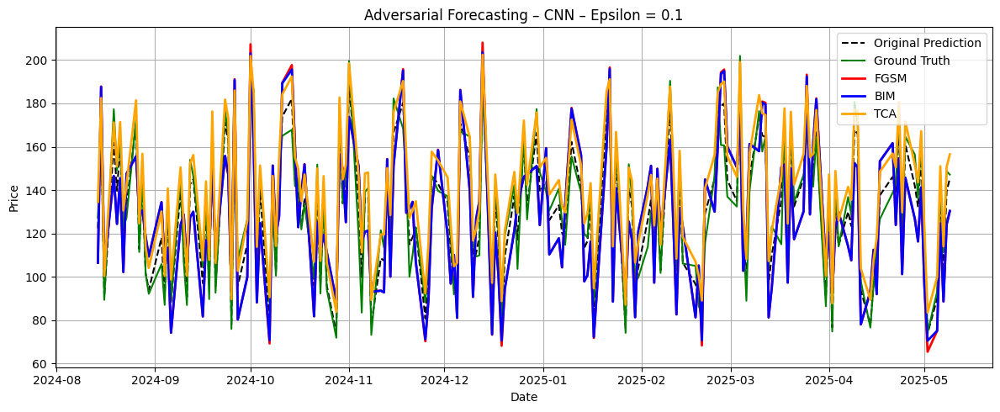

FGSM – Epsilon 0.20 – MAE: 36.1510 | SIM: 0.9626 | RSME: 36.5437
BIM – Epsilon 0.20 – MAE: 34.8261 | SIM: 0.9649 | RSME: 35.3993
TCA – Epsilon 0.20 – MAE: 20.7451 | SIM: 0.9981 | RSME: 21.9873


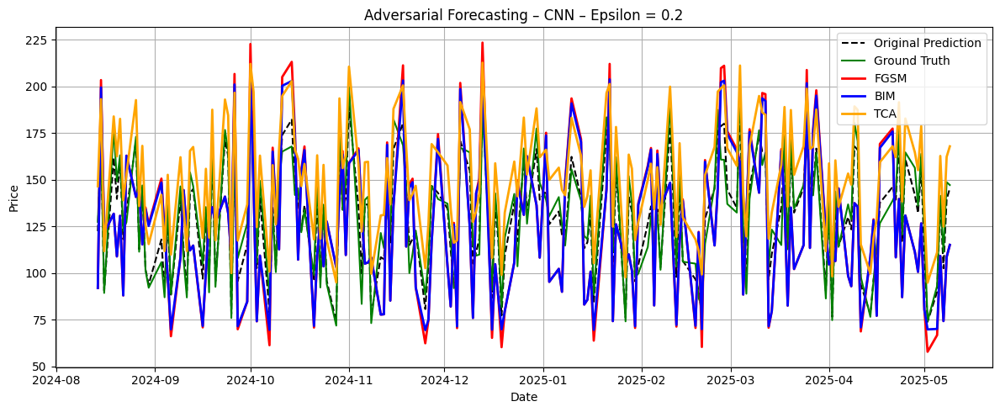

In [59]:
run_and_log_attack_google(
    model=model_google_CNN,
    model_name='CNN',
    loss_fn=loss_fn,
    test_loader=test_loader,
    test_dates=test_dates,
    predictions_denorm=predictions_denorm,
    true_values_denorm=true_values_denorm,
    price_min=price_min,
    price_max=price_max,
    res_tab=res_tab
)


## PLOT RESULT TAB

In [60]:
display(res_tab)

Attack         NA      FGSM                             BIM             \
ε            0.00      0.01       0.10       0.20      0.01       0.10   
Model Metric                                                             
LSTM  MAE     NaN  4.206557  17.510525  31.938578  4.204484  17.280537   
      RSME    NaN  4.828532  17.674337  32.045858  4.824979  17.495446   
      SIM     NaN  0.999368   0.991668   0.973558  0.999369   0.991844   
RNN   MAE     NaN  5.881297  18.517593  33.084377  5.879187  18.204193   
      RSME    NaN  6.586210  18.769987  33.288726  6.584308  18.496781   
      SIM     NaN  0.999470   0.995088   0.985674  0.999472   0.995318   
CNN   MAE     NaN  7.616785  21.335281  36.150970  7.615414  21.159634   
      SIM     NaN  0.997955   0.986920   0.962578  0.997956   0.987112   
      RSME    NaN  8.761746  21.807839  36.543717  8.760145  21.663210   

Attack                        TCA                        
ε                  0.20      0.01       0.10       0.20  
Model Metric                                             
LSTM  MAE     30.706276  3.113605  14.216945  28.022091  
      RSME    31.131152  4.047290  14.661970  28.265809  
      SIM      0.975109  0.999626   0.999461   0.998764  
RNN   MAE     33.708794  3.748855   9.359488  22.539530  
      RSME    35.654095  4.538398  10.016361  22.848575  
      SIM      0.982148  0.999631   0.999536   0.999047  
CNN   MAE     34.826118  6.021703  10.051059  20.745129  
      SIM      0.964877  0.998494   0.998322   0.998057  
      RSME    35.399264  7.402014  12.122819  21.987291

## Analysis and Question

* As observed in the temperature prediction dataset, the results for FGSM and BIM attacks are surprisingly similar across all models (LSTM, RNN, CNN), particularly in terms of MAE and RMSE. This is counter-intuitive, as BIM is designed to be a stronger iterative version of FGSM. In most literature, BIM tends to lead to larger perturbations and more severe degradation in performance.

* Moreover, across all models, TCA tends to produce the highest SIM values among all attacks, which aligns with its design principle: maintaining structural similarity while degrading predictive accuracy.
However, TCA often results in lower MAE and RMSE compared to FGSM/BIM, especially at higher perturbation levels(ε). This suggests that while TCA is more stealthy, its impact on prediction accuracy is generally less severe than FGSM or BIM. This behavior is consistent with the trade-off TCA is designed for: preserving the temporal structure of the original signal (hence high SIM) at the cost of achieving less drastic prediction errors. This makes TCA potentially more dangerous in practice, as its higher stealthiness can evade detection despite causing smaller but consistent degradations in performance.